In [1]:
# Disable warnings
import warnings
warnings.filterwarnings('ignore')

# Handle data
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10, 6)

# Model and evaluation
from powershap import PowerShap
from sklearn.linear_model import LinearRegression, LogisticRegression
from xgboost import XGBRegressor, XGBClassifier
from sklearn.metrics import root_mean_squared_error, accuracy_score, r2_score, confusion_matrix

# Typing
from typing import Literal
from sklearn.base import RegressorMixin, ClassifierMixin

# Progress bar
from tqdm import tqdm

# Introspection
import inspect

# File system
from pathlib import Path

In [2]:
train_data = pd.read_csv('train.csv', index_col='date_id')
train_data

,D1,D2,D3,D4,D5,D6,D7,D8,D9,E1,E10,E11,E12,E13,E14,E15,E16,E17,E18,E19,E2,E20,E3,E4,E5,E6,E7,E8,E9,I1,I2,I3,I4,I5,I6,I7,I8,I9,M1,M10,M11,M12,M13,M14,M15,M16,M17,M18,M2,M3,M4,M5,M6,M7,M8,M9,P1,P10,P11,P12,P13,P2,P3,P4,P5,P6,P7,P8,P9,S1,S10,S11,S12,S2,S3,S4,S5,S6,S7,S8,S9,V1,V10,V11,V12,V13,V2,V3,V4,V5,V6,V7,V8,V9,forward_returns,risk_free_rate,market_forward_excess_returns
date_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,1,1,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.002421,0.000301,-0.003038
1,0,0,0,1,1,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.008495,0.000303,-0.009114
2,0,0,0,1,0,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009624,0.000301,-0.010243
3,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004662,0.000299,0.004046
4,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.011686,0.000299,-0.012301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9016,0,0,0,1,0,0,0,0,0,1.493117,0.174272,0.002315,0.002315,0.002315,0.002315,0.928241,-0.381781,-0.499285,0.087241,-0.689460,1.414128,1.469108,1.848055,0.035714,0.321429,0.024471,0.109229,-0.327450,0.999669,0.360780,0.732659,0.075066,0.457011,0.525397,0.703704,0.345238,0.385582,0.517770,-1.226535,-0.873949,-0.239594,0.082394,-1.163527,-0.720916,0.210979,0.457672,0.265873,0.085979,-1.522273,2.246416,0.304850,1.279428,-0.029177,0.054771,0.643849,0.512282,0.338624,2.126790,2.320867,-0.184049,0.097553,-1.524343,0.623016,0.067130,-0.810821,-0.069025,1.868031,1.877110,0.044312,0.362124,0.957672,0.886243,0.263976,-0.074093,0.156730,0.699735,-0.373982,0.370370,0.948413,0.808137,0.025794,0.345899,-0.346978,0.122685,0.359788,-0.251129,0.541005,0.208995,0.484788,0.717308,0.677249,-0.327455,0.083995,-0.380452,-0.000015,0.000151,-0.000477
9017,0,0,0,1,0,0,0,0,0,1.490889,0.173942,0.001984,0.001984,0.001984,0.001984,0.928571,-0.381927,-0.499494,0.086729,-0.558935,1.410120,1.466890,1.842600,0.035384,0.321098,0.024140,0.109098,-0.327458,1.000000,0.360450,0.696815,0.074735,0.463294,0.518749,0.699735,0.332011,0.371032,0.513565,-1.218650,-0.890325,-0.246998,0.124983,-1.195221,-0.723577,

In [3]:
X = train_data.iloc[:, :94]
X

,D1,D2,D3,D4,D5,D6,D7,D8,D9,E1,E10,E11,E12,E13,E14,E15,E16,E17,E18,E19,E2,E20,E3,E4,E5,E6,E7,E8,E9,I1,I2,I3,I4,I5,I6,I7,I8,I9,M1,M10,M11,M12,M13,M14,M15,M16,M17,M18,M2,M3,M4,M5,M6,M7,M8,M9,P1,P10,P11,P12,P13,P2,P3,P4,P5,P6,P7,P8,P9,S1,S10,S11,S12,S2,S3,S4,S5,S6,S7,S8,S9,V1,V10,V11,V12,V13,V2,V3,V4,V5,V6,V7,V8,V9
date_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,1,1,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0,0,1,1,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0,0,1,0,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9016,0,0,0,1,0,0,0,0,0,1.493117,0.174272,0.002315,0.002315,0.002315,0.002315,0.928241,-0.381781,-0.499285,0.087241,-0.689460,1.414128,1.469108,1.848055,0.035714,0.321429,0.024471,0.109229,-0.327450,0.999669,0.360780,0.732659,0.075066,0.457011,0.525397,0.703704,0.345238,0.385582,0.517770,-1.226535,-0.873949,-0.239594,0.082394,-1.163527,-0.720916,0.210979,0.457672,0.265873,0.085979,-1.522273,2.246416,0.304850,1.279428,-0.029177,0.054771,0.643849,0.512282,0.338624,2.126790,2.320867,-0.184049,0.097553,-1.524343,0.623016,0.067130,-0.810821,-0.069025,1.868031,1.877110,0.044312,0.362124,0.957672,0.886243,0.263976,-0.074093,0.156730,0.699735,-0.373982,0.370370,0.948413,0.808137,0.025794,0.345899,-0.346978,0.122685,0.359788,-0.251129,0.541005,0.208995,0.484788,0.717308,0.677249,-0.327455,0.083995,-0.380452
9017,0,0,0,1,0,0,0,0,0,1.490889,0.173942,0.001984,0.001984,0.001984,0.001984,0.928571,-0.381927,-0.499494,0.086729,-0.558935,1.410120,1.466890,1.842600,0.035384,0.321098,0.024140,0.109098,-0.327458,1.000000,0.360450,0.696815,0.074735,0.463294,0.518749,0.699735,0.332011,0.371032,0.513565,-1.218650,-0.890325,-0.246998,0.124983,-1.195221,-0.723577,0.211971,0.501984,0.265212,0.085648,-0.127338,1.412838,0.307175,1.614255,0.162533,0.054045,0.622024,0.511618,0.382937,2.121361,2.316354,-0.712623,0.454034,-1.535169,0.388558,0.338294,-0.165436,-0.336926,0.373364,1.878755,0.042328,0.389736,0.523148,

In [4]:
test = pd.read_csv('test.csv', index_col='date_id')
test

,D1,D2,D3,D4,D5,D6,D7,D8,D9,E1,E10,E11,E12,E13,E14,E15,E16,E17,E18,E19,E2,E20,E3,E4,E5,E6,E7,E8,E9,I1,I2,I3,I4,I5,I6,I7,I8,I9,M1,M10,M11,M12,M13,M14,M15,M16,M17,M18,M2,M3,M4,M5,M6,M7,M8,M9,P1,P10,P11,P12,P13,P2,P3,P4,P5,P6,P7,P8,P9,S1,S10,S11,S12,S2,S3,S4,S5,S6,S7,S8,S9,V1,V10,V11,V12,V13,V2,V3,V4,V5,V6,V7,V8,V9,is_scored,lagged_forward_returns,lagged_risk_free_rate,lagged_market_forward_excess_returns
date_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8980,0,0,0,0,1,0,0,1,0,1.577651,0.186177,0.001323,0.001323,0.001323,0.001323,0.955026,-0.583419,-0.704264,0.298365,-0.691361,1.259065,1.556516,1.712580,0.033069,0.333333,0.036376,-0.046483,-0.312326,0.913029,0.306217,1.025756,0.081349,0.478175,0.675627,0.699735,0.256283,0.360450,0.676061,-1.310438,-0.392342,-0.236100,0.169554,-1.196419,-0.760030,0.641204,0.916667,0.289683,0.318783,-0.321981,3.394801,0.110939,0.755237,-0.318948,-0.596875,0.867394,0.348006,0.470569,2.113675,2.247820,0.882724,0.794643,-1.427834,0.352513,0.926257,0.431383,-0.476976,0.500245,1.784173,0.029762,0.294719,0.514550,0.446429,0.466551,0.085717,-0.230132,0.272487,-0.106894,0.199735,0.409392,0.532717,0.744048,0.440476,-0.654839,0.699735,0.699074,-0.502400,0.882937,0.892196,0.828042,0.999172,0.759921,-0.803127,0.170966,-0.751909,True,0.003541,0.000161,0.003068
8981,0,0,0,0,1,0,0,1,0,1.575182,0.185847,0.000992,0.000992,0.000992,0.000992,0.955357,-0.583074,-0.703759,0.297608,-0.504499,1.193468,1.554184,1.640054,0.032738,0.333003,0.036045,0.073582,-0.312345,0.913360,0.305886,0.989571,0.082672,0.477844,0.661527,0.719577,0.255952,0.361111,0.660556,-1.234687,-0.357220,-0.220754,0.191398,-1.203526,-0.759527,0.641865,0.852513,0.289021,0.318452,0.380119,0.298001,0.010021,1.126653,-0.314881,-0.597245,0.961640,0.313527,0.331019,2.089552,2.199278,-0.428140,0.711310,-1.376520,0.953042,0.386905,0.523549,-0.421365,-0.234829,1.770175,0.033730,0.304496,0.638228,0.636905,1.849101,0.281690,-0.041995,0.448413,0.094321,0.215608,0.409392,0.597864,0.872354,0.691138,-0.583443,0.629960,0.598545,-0.394268,0.863757,0.699074,0.831349,1.120336,0.556217,-0.686192,0.141865,-0.660326,True,-0.005964,0.000162,-0.006437
8982,0,0,0,0,1,0,0,0,1,1.572720,0.185516,0.000661,0.000661,0.000661,0.000661,0.955688,-0.083356,-0.573546,0.225822,-0.393903,1.123361,1.551723,1.562722,0.032407,0.332672,0.035714,0.033581,-0.312364,0.913690,0.291997,1.040514,0.081349,0.477513,0.655741,0.724206,0.226190,0.355820,0.650325,-1.128989,-0.347297,-0.241044,0.199469,-1.189592,-0.757391,0.652116,0.879630,0.288360,0.318122,1.351334,0.391480,-0.233158,0.860735,-0.244248,-0.596983,0.513228,0.276338,0.348545,2.067406,2.149585,0.368688,0.212632,-1.347620,0.210979,0.635251,-1.138198,-0.494248,-1.042718,1.754171,0.032407,0.257609,0.082011,0.152116,-0.201611,0.346373,0.054032,0.137566,0.294305,0.194444,0.409392,0.596528,0.778439,0.634921,-0.483236,0.669974,0.603836,-0.170420,0.848545,0.647487,0.832672,1.088992,0.665344,-0.459367,0.199405,-0.510979,True,-0.007410,0.000160,-0.007882
8983,0,0,0,0,1,0,0,0,1,1.570266,0.185185,0.019841,0.019841,0.006614,0.006614,0.956019,-0.083403,-0.573180,0.225094,-0.541646,1.167982,1.549272,1.611215,0.032077,0.332341,0.035384,0.033998,-0.312383,0.914021,0.267196,1.091376,0.085979,0.477183,0.648582,0.728175,0.230159,0.351852,0.649528,-1.150431,-0.300917,-0.145171,0.269389,-1.165139,-0.754948,0.652116,0.853836,0.279431,0.317791,-0.212995,3.032725,0.024158,1.426994,-0.286942,-0.572019,0.681548,0.302134,0.309193,2.079415,2.175705,0.368943,0.660714,-1.399411,0.724868,0.216270,-0.230557,-0.318347,0.396917,1.769678,0.033730,0.202350,0.324074,0.212963,0.052878,-0.049023,0.120828,0.219577,0.137942,0.167328,0.409392,0.579726,0.449735,0.665344,-0.546298,0.590608,0.558862,-0.275099,0.826058,0.445767,0.835979,1.040988,0.594577,-0.561643,0.161706,-0.575997,True,0.005420,0.000160,0.004949
8984,0,0,0,0,0,0,1,0,1,1.567818,0.184854,0.019511,0.019511,0.006283,0.006283,0.956349,-0.083449,-0.572813,0.224366,-0.7145

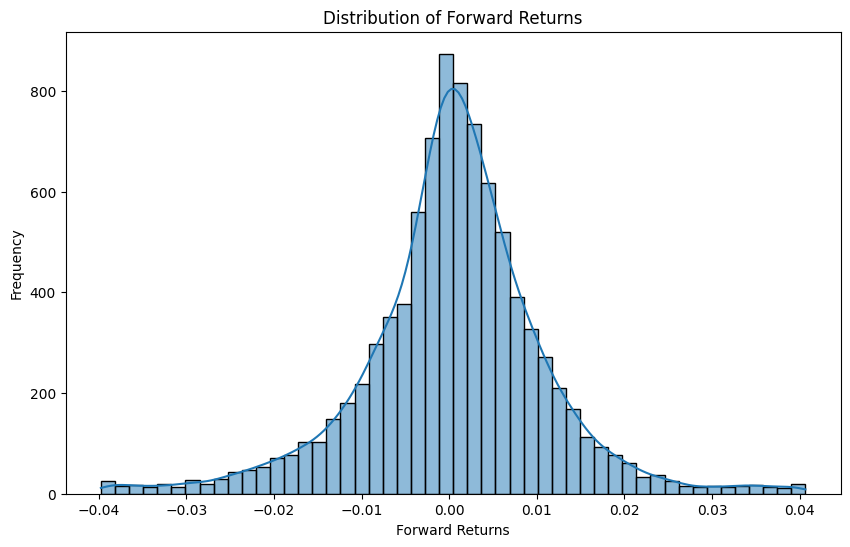

In [5]:
sns.histplot(train_data['forward_returns'], bins=50, kde=True)
plt.title('Distribution of Forward Returns')
plt.xlabel('Forward Returns')
plt.ylabel('Frequency')
plt.show()

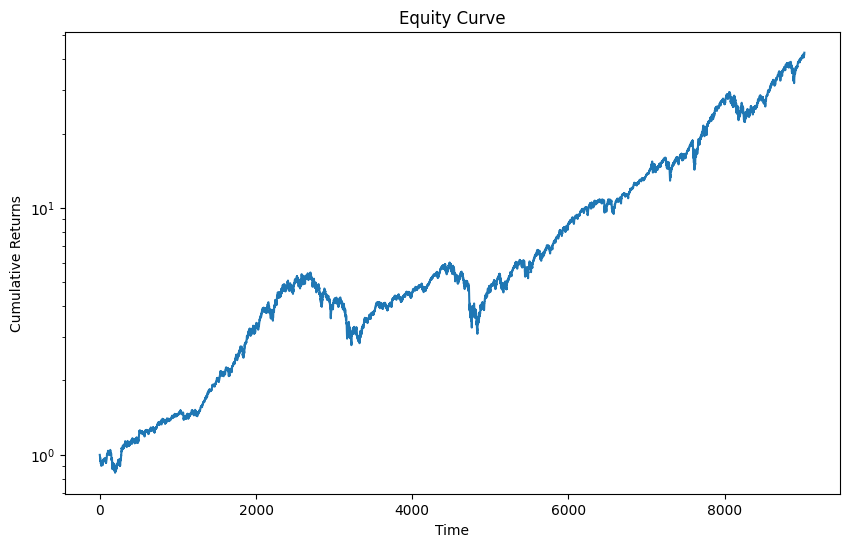

In [6]:
equity_curve = (1 + train_data['forward_returns']).cumprod()
plt.plot(equity_curve)
plt.title('Equity Curve')
plt.xlabel('Time')
plt.ylabel('Cumulative Returns')
plt.yscale('log')
plt.show()

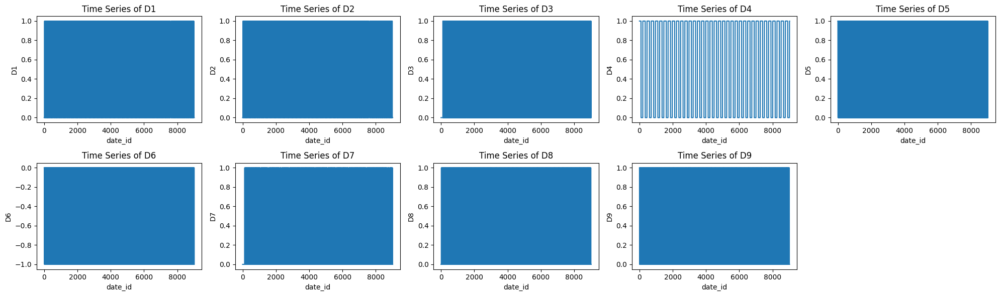

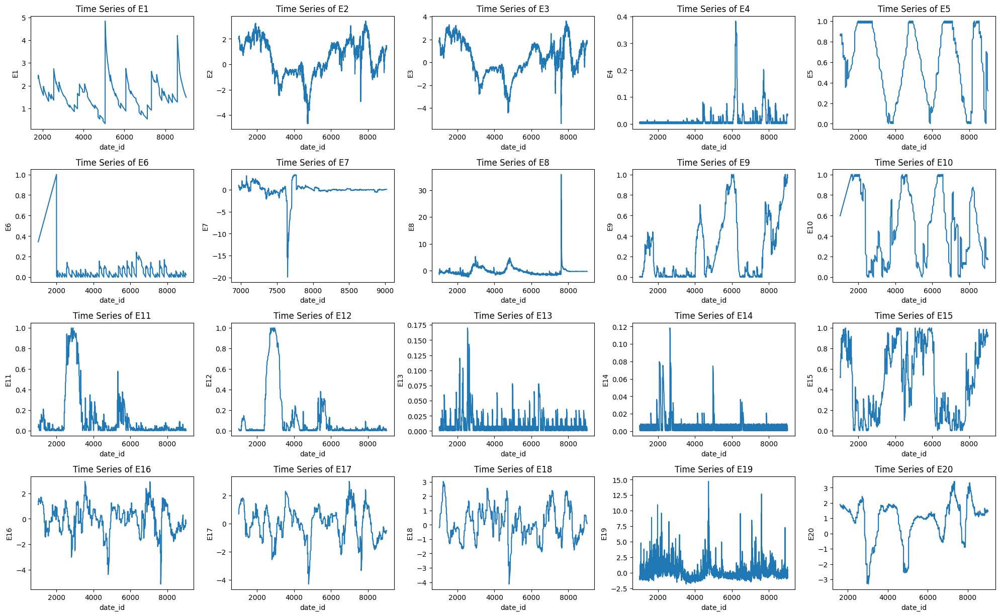

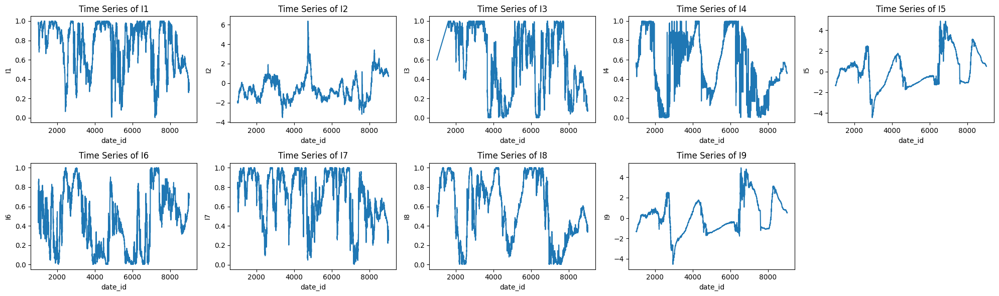

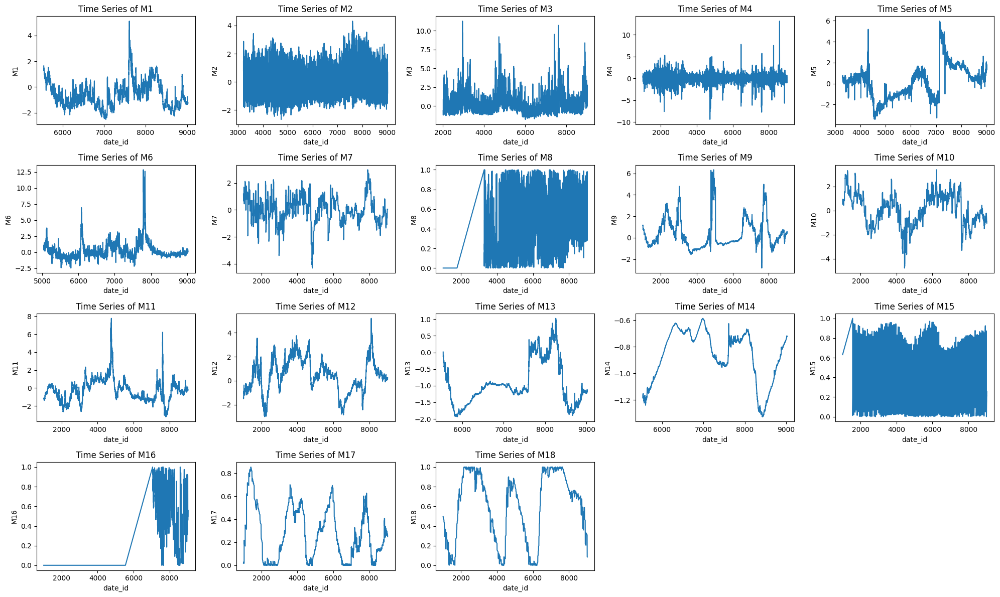

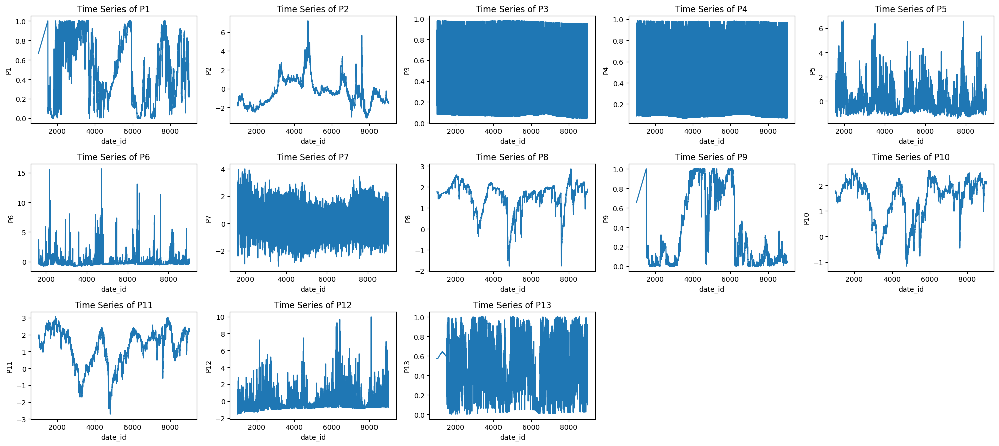

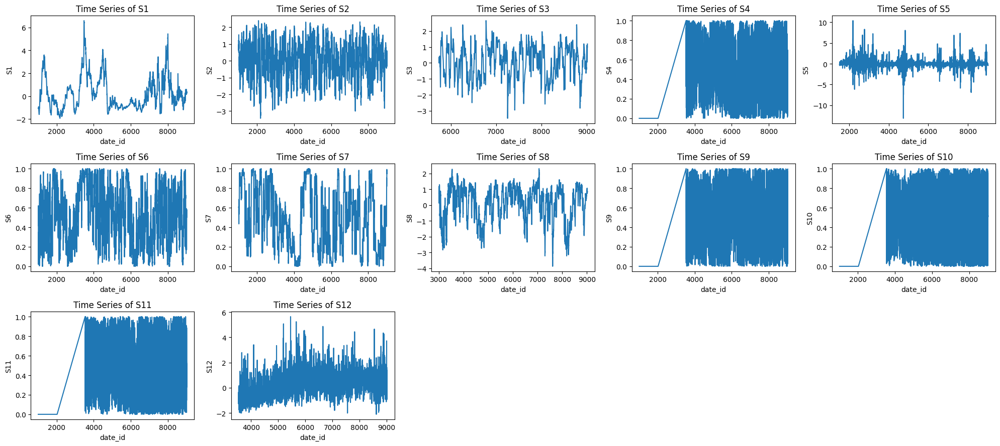

In [ ]:
cat = ''
columns = []
for col in train_data.columns:
    if col[0] == cat:
        columns.append(col)
    else:
        if col[0] != col[0].upper():
            break
        
        if columns:
            columns.sort(key=lambda x: int(x[1:]))
            
            plt.figure(figsize=(20, 3 * (len(columns) // 5 + 1)))
            plt.subplot(len(columns) // 5 + 1, 5, 1)
            for i, c in enumerate(columns):
                plt.subplot(len(columns) // 5 + 1, 5, i + 1)
                sns.lineplot(data=train_data, x=train_data.index, y=c)
                plt.title(f'Time Series of {c}')
            plt.tight_layout()
            plt.show()
            
        cat = col[0]
        columns = [col]
        

In [ ]:
def get_model_type(model: RegressorMixin | ClassifierMixin) -> Literal['classifier', 'regressor']:
    return model._estimator_type

def get_result_path(window: int, delta: int, h: int, model: RegressorMixin | ClassifierMixin, category: str) -> Path:
    model_name = model.__class__.__name__
    return Path('results') / f'window={window}&delta={delta}&h={h}' / model_name / f'{category}.csv'

def save_result_csv(window: int, delta: int, h: int, model: RegressorMixin | ClassifierMixin, category: str, data: pd.DataFrame | pd.Series):
    path = get_result_path(window, delta, h, model, category)
    path.parent.mkdir(parents=True, exist_ok=True)
    data.to_csv(path, header=True)

def get_result_csv(window: int, delta: int, h: int, model: RegressorMixin | ClassifierMixin, category: str) -> pd.DataFrame | pd.Series:
    path = get_result_path(window, delta, h, model, category)
    return pd.read_csv(path, index_col='date_id').squeeze() if path.exists() else None

def train(X: pd.DataFrame, forward_returns: pd.Series, window: int, delta: int, h: int, model: RegressorMixin | ClassifierMixin, ps_periods: int = 20):
    if get_result_csv(window, delta, h, model, 'y_true') is None:
        return
    
    model_type = get_model_type(model)
    model_name = model.__class__.__name__

    # h-day forward returns as target
    y = forward_returns.rolling(h).apply(lambda x: (1 + x).prod() - 1, raw=True).shift(-h+1)
    if model_type == 'classifier':
        y = (y > 0).astype(int)
    
    # Total time points
    T = X.shape[0]

    # Number of iterations
    K = int((T - (window + 2 * h)) / delta)

    # Conduct PowerShap every ps_periods
    ps_iter_periods = int(ps_periods / delta)
    
    # Predicitions with all features and PowerShap selected features
    base_pred = pd.Series(index=y.index)
    ps_pred = base_pred.copy()
    
    # Number of selected features over time
    n_feats = pd.Series(index=X.index[window+h:K*delta+window+h:ps_periods])
    
    # Impacts and impact ratios over time
    impacts = pd.DataFrame(index=X.index[window+h:K*delta+window+h:ps_periods], columns=X.columns)
    impacts_ratios = impacts.copy()
    
    # PowerShap selector and selected features
    selector = None
    feats = np.array([])
    
    # Check if model.fit supports verbose parameter
    fit_params = inspect.signature(model.fit).parameters
    fit_kwargs = {'verbose': 0} if 'verbose' in fit_params else {}

    for k in tqdm(range(K), desc=f'Processing {model_name} with window={window}, delta={delta}, h={h}'):
        t = k * delta
        train_indices = slice(t, t + window)
        test_indices = slice(t + window + h, t + window + h + delta)
        X_train = X.iloc[train_indices].dropna(axis=1)
        y_train = y.iloc[train_indices]
        X_test = X.iloc[test_indices][X_train.columns]
        
        # Fit PowerShap periodically
        if selector is None or k % ps_iter_periods == 0:
            selector = PowerShap(
                model = model,
                automatic=True,
                verbose=0,
                show_progress=False
            )
            selector.fit(X_train, y_train, **fit_kwargs)
            
            feats = selector.get_feature_names_out()
            n_feats.loc[X.index[t + window + h]] = len(feats)
            
            impact = selector._processed_shaps_df['impact'].drop(index=['random_uniform_feature'])
            
            impacts.loc[X.index[t + window + h]] = impact
            impacts_ratios.loc[X.index[t + window + h]] = impact / impact.sum()
        
        # Skip if not enough classes for classifier or no features selected
        if model_type == 'classifier' and y_train.nunique() < 2 or len(feats) == 0:
            continue
        
        base_pred[X.index[test_indices]] = model.fit(X_train, y_train, **fit_kwargs).predict(X_test)
        ps_pred[X.index[test_indices]] = model.fit(X_train[feats], y_train, **fit_kwargs).predict(X_test[feats])
            
    # Save results
    for category, values in zip(
        ['y_true', 'base_pred', 'ps_pred', 'impacts', 'impacts_ratios', 'n_feats'],
        [y, base_pred, ps_pred, impacts, impacts_ratios, n_feats]
    ):
        save_result_csv(window, delta, h, model, category, values)
        
def evaluate(window: int, delta: int, h: int, model):
    y_true = get_result_csv(window, delta, h, model, 'y_true')
    base_pred = get_result_csv(window, delta, h, model, 'base_pred')
    ps_pred = get_result_csv(window, delta, h, model, 'ps_pred')
    
    mask = ~np.isnan(ps_pred)
    y_true = y_true[mask]
    base_pred = base_pred[mask]
    ps_pred = ps_pred[mask]
    
    metrics = {
        'RMSE': root_mean_squared_error,
        'Accuracy': accuracy_score
    }
    metric = 'RMSE' if get_model_type(model) == 'regressor' else 'Accuracy'
    metric_fn = metrics[metric]
    scores = metric_fn(y_true, base_pred), metric_fn(y_true, ps_pred)
    
    model_name = model.__class__.__name__
    print(f'{model_name} {metric}: {scores[0]:.6f}')
    print(f'{model_name} with PowerShap {metric}: {scores[1]:.6f}')
    print('---')
    
    return scores

def plot_results(window, delta, h, model):
    y_true = get_result_csv(window, delta, h, model, 'y_true')
    base_pred = get_result_csv(window, delta, h, model, 'base_pred')
    ps_pred = get_result_csv(window, delta, h, model, 'ps_pred')
    
    mask = ~np.isnan(ps_pred)
    y_true = y_true[mask]
    base_pred = base_pred[mask]
    ps_pred = ps_pred[mask]
    
    model_name = model.__class__.__name__
    
    if get_model_type(model) == 'regressor':
        # Scatter plot with r2 score
        plt.figure(figsize=(16, 6))
        
        plt.subplot(1, 2, 1)
        sns.scatterplot(x=y_true, y=base_pred)
        plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--')
        plt.title(rf'All Features, $R^2$: {r2_score(y_true, base_pred):.4f}')
        plt.xlabel('True Values')
        plt.ylabel('Predictions')
        
        plt.subplot(1, 2, 2)
        sns.scatterplot(x=y_true, y=ps_pred)
        plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--')
        plt.title(rf'PowerShap Selected Features, $R^2$: {r2_score(y_true, ps_pred):.4f}')
        plt.xlabel('True Values')
        plt.ylabel('Predictions')
        
        plt.suptitle(f'{model_name} Predictions vs True Values')
        plt.show()
    else:
        # Confusion matrix
        cm_base = confusion_matrix(y_true, base_pred)
        cm_ps = confusion_matrix(y_true, ps_pred)
        
        plt.figure(figsize=(16, 6))
        
        plt.subplot(1, 2, 1)
        sns.heatmap(cm_base, annot=True, fmt='d', cmap='Blues')
        plt.title('All Features Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        
        plt.subplot(1, 2, 2)
        sns.heatmap(cm_ps, annot=True, fmt='d', cmap='Blues')
        plt.title('PowerShap Selected Features Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        
        plt.suptitle(f'{model_name} Confusion Matrices')
        plt.show()
    
def plot_feature_impacts(window, delta, h, model):
    n_feats = get_result_csv(window, delta, h, model, 'n_feats')
    impacts = get_result_csv(window, delta, h, model, 'impacts')
    impacts_ratios = get_result_csv(window, delta, h, model, 'impacts_ratios')
    
    avg_impacts = impacts.median().sort_values(ascending=False)[:10]
    avg_impacts_ratios = impacts_ratios.median().sort_values(ascending=False)[:10]
    
    desc = f'model={model.__class__.__name__}, window={window}, delta={delta}, h={h}'
    
    # Number of features over time
    plt.figure(figsize=(16, 6))
    sns.lineplot(data=n_feats, legend=False)
    plt.title(f'Number of Selected Features Over Time ({desc})')
    plt.xlabel(n_feats.index.name)
    plt.ylabel('Number of Features')
    plt.show()
    
    # Number of features box plot
    plt.figure(figsize=(6, 6))
    sns.boxplot(data=n_feats)
    plt.title(f'Number of Selected Features Distribution ({desc})')
    plt.xlabel('Features')
    plt.ylabel('Number of Features')
    plt.show()
    
    # Median impacts bar plot
    plt.figure(figsize=(16, 6))
    sns.barplot(x=avg_impacts.index, y=avg_impacts.values)
    plt.xticks(rotation=90)
    plt.title(f'Median Feature Impacts ({desc})')
    plt.xlabel('Features')
    plt.ylabel('Median Impact')
    plt.show()
    
    # Median impact ratios bar plot
    plt.figure(figsize=(16, 6))
    sns.barplot(x=avg_impacts_ratios.index, y=avg_impacts_ratios.values)
    plt.xticks(rotation=90)
    plt.title(f'Median Feature Impact Ratios ({desc})')
    plt.xlabel('Features')
    plt.ylabel('Median Impact Ratio')
    plt.show()
    
    # Impact over time
    max_impacts = impacts.max()
    top_10_features = max_impacts.nlargest(10).index
    plt.figure(figsize=(15, 8))
    for col in top_10_features:
        line = plt.plot(impacts.index, impacts[col], label=col)
        max_val = impacts[col].max()
        max_idx = impacts[col].idxmax()
        plt.text(max_idx, max_val, col, color=line[0].get_color())
    plt.title(f'Feature Impacts Over Time ({desc})')
    plt.xlabel(impacts.index.name)
    plt.ylabel('Impact')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    
    # Impact ratios over time
    max_ratios = impacts_ratios.max()
    top_10_features_ratios = max_ratios.nlargest(10).index
    plt.figure(figsize=(15, 8))
    for col in top_10_features_ratios:
        line = plt.plot(impacts_ratios.index, impacts_ratios[col], label=col)
        max_val = impacts_ratios[col].max()
        max_idx = impacts_ratios[col].idxmax()
        plt.text(max_idx, max_val, col, color=line[0].get_color())
    plt.title(f'Feature Impact Ratios Over Time ({desc})')
    plt.xlabel(impacts_ratios.index.name)
    plt.ylabel('Impact Ratio')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

In [45]:
train_params = dict(
    X = X,
    forward_returns = train_data['forward_returns'],
    window = 252,
    delta = 60,
    h = 60,
    model = XGBRegressor(),
    ps_periods = 60,
)
train(**train_params)

Processing XGBRegressor with window=252, delta=60, h=60: 100%|██████████| 144/144 [04:36<00:00,  1.92s/it]


In [59]:
eval_params = {k: v for k, v in train_params.items() if k not in ['X', 'forward_returns', 'ps_periods']}
evaluate(**eval_params)

XGBRegressor RMSE: 0.089597
XGBRegressor with PowerShap RMSE: 0.089476
---


(0.08959745198001484, 0.08947578134690422)

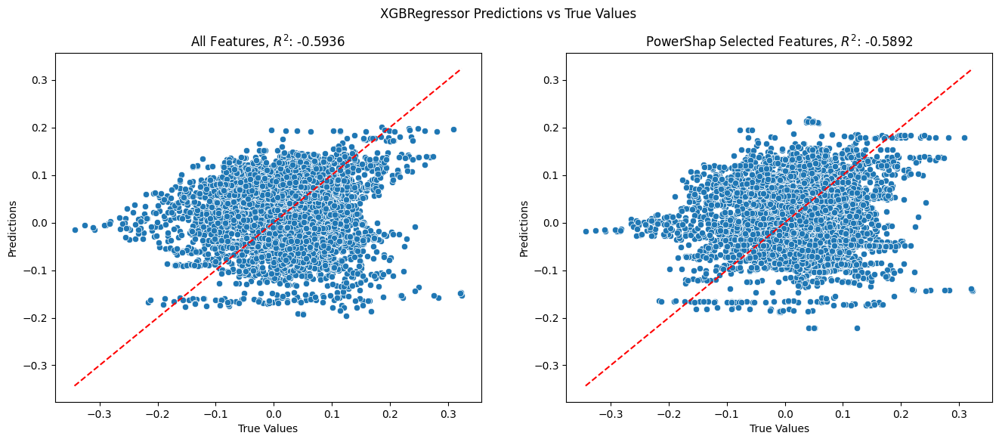

In [60]:
plot_results(**eval_params)

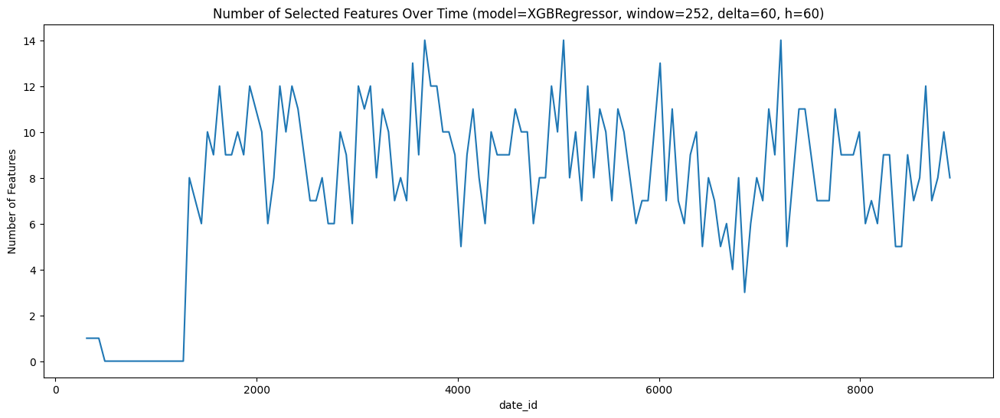

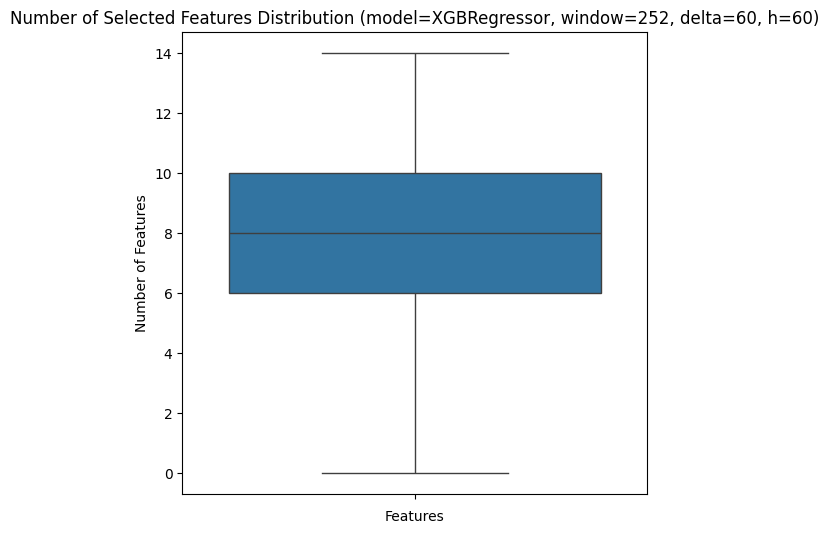

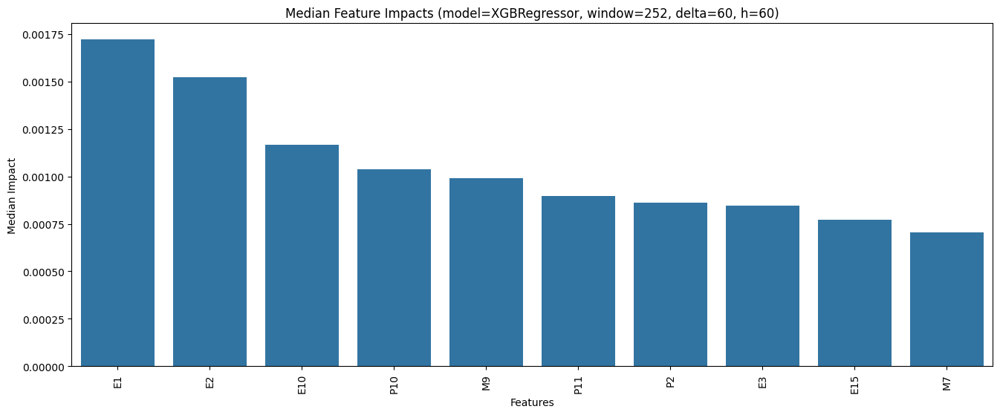

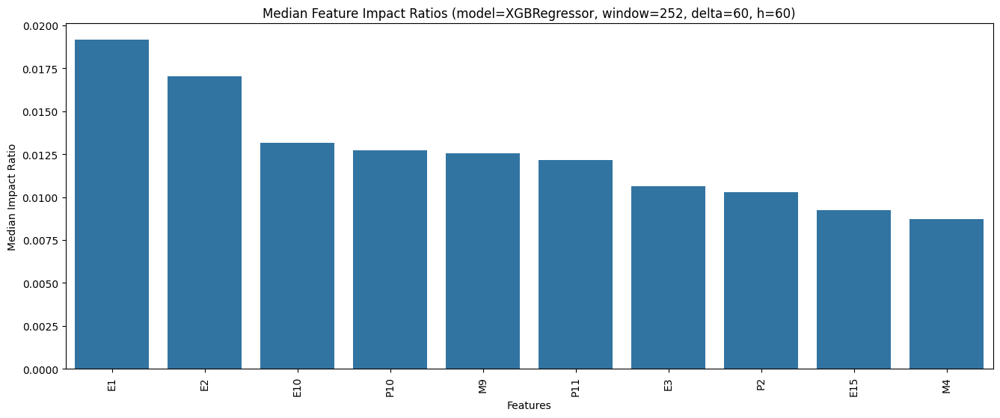

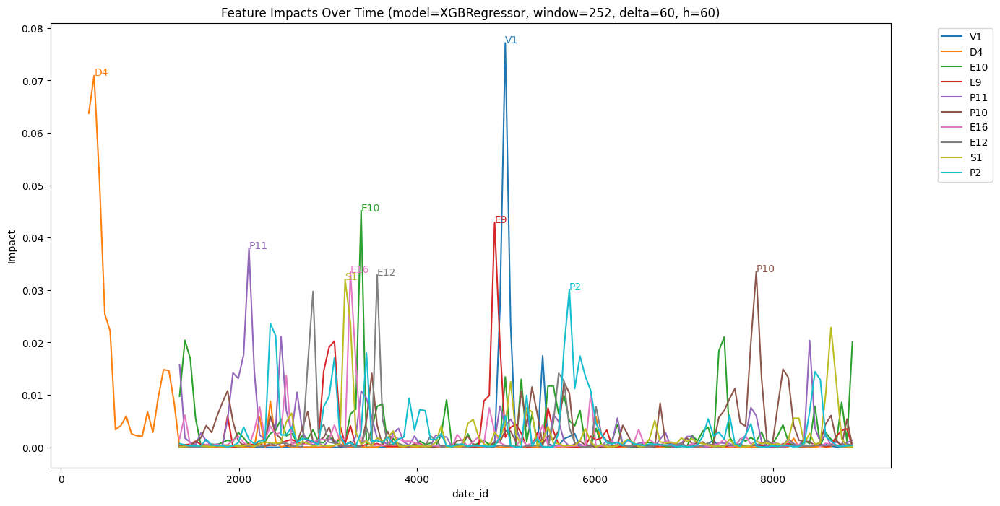

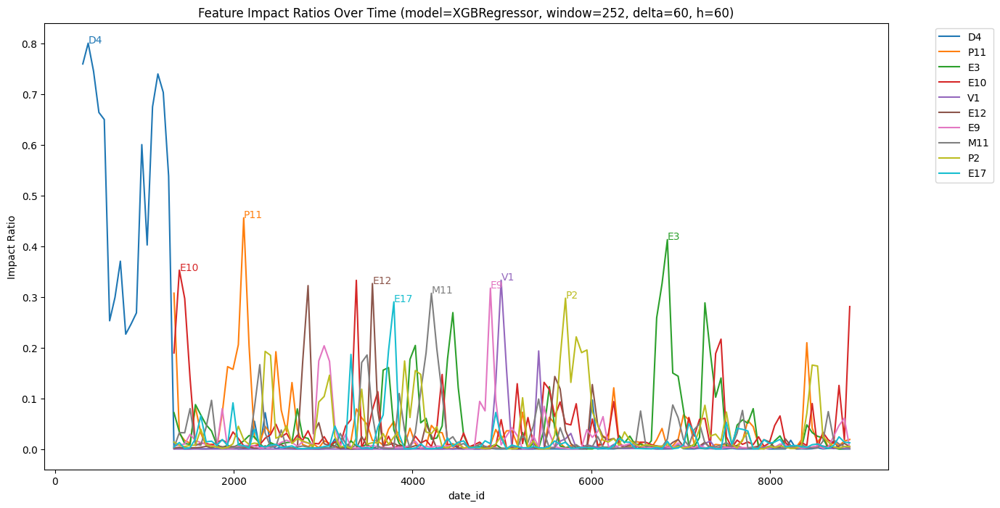

In [61]:
plot_feature_impacts(**eval_params)

In [9]:
window = 252
delta = 5
model = XGBRegressor()
hs = [5, 10, 20]
for h in hs:
    train(
        X = X,
        forward_returns = train_data['forward_returns'],
        window = window,
        delta = delta,
        h = h,
        model = model,
    )

Processing XGBRegressor with window=252, delta=5, h=5: 100%|██████████| 1751/1751 [10:25<00:00,  2.80it/s]
Processing XGBRegressor with window=252, delta=5, h=10: 100%|██████████| 1749/1749 [12:59<00:00,  2.24it/s]
Processing XGBRegressor with window=252, delta=5, h=20: 100%|██████████| 1745/1745 [10:45<00:00,  2.70it/s]


XGBRegressor RMSE: 0.028402
XGBRegressor with PowerShap RMSE: 0.030359
---


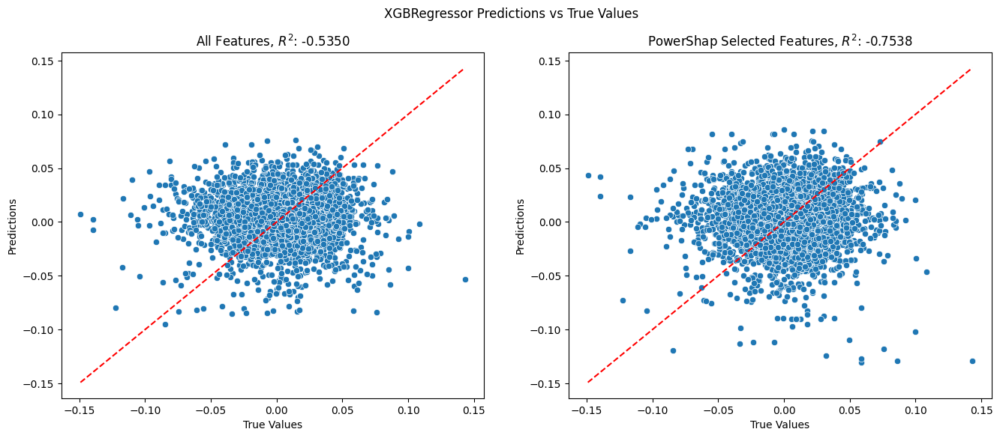

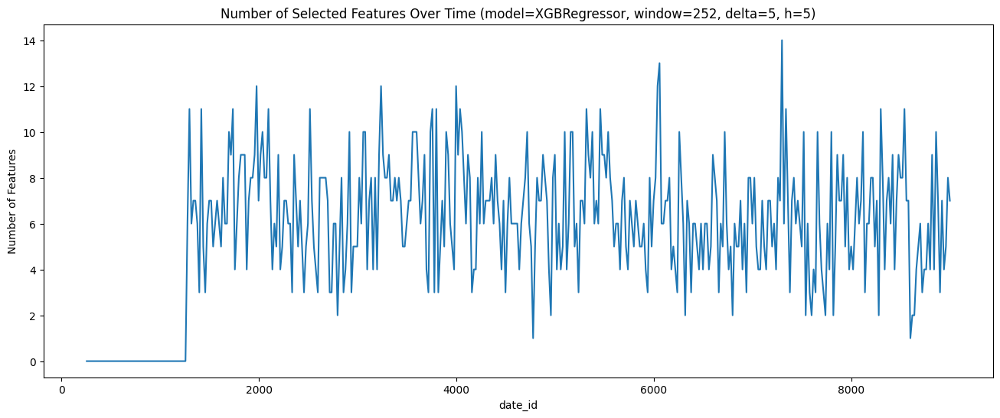

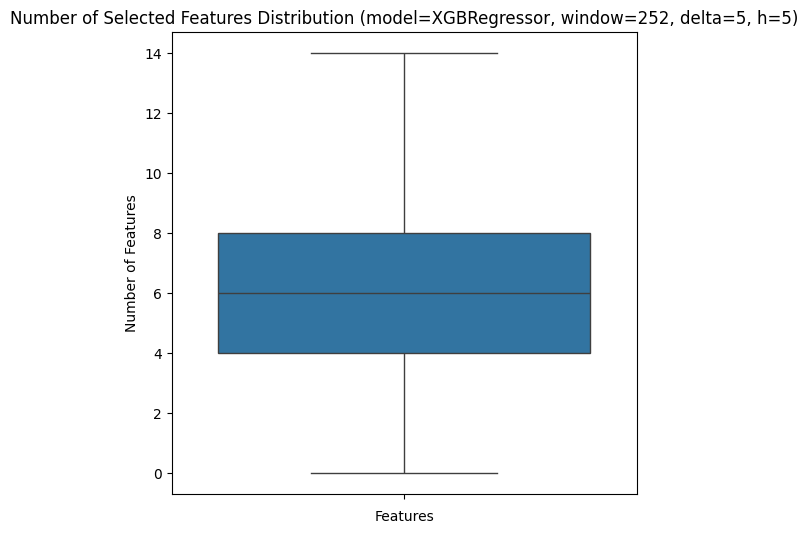

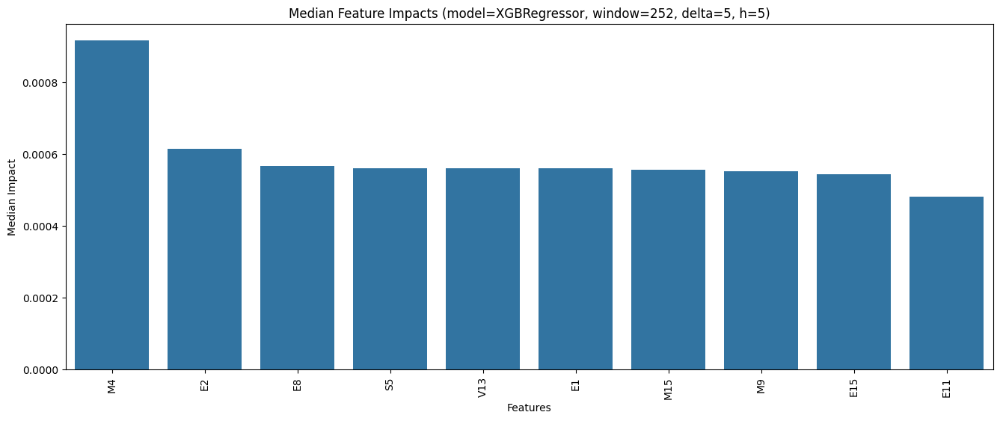

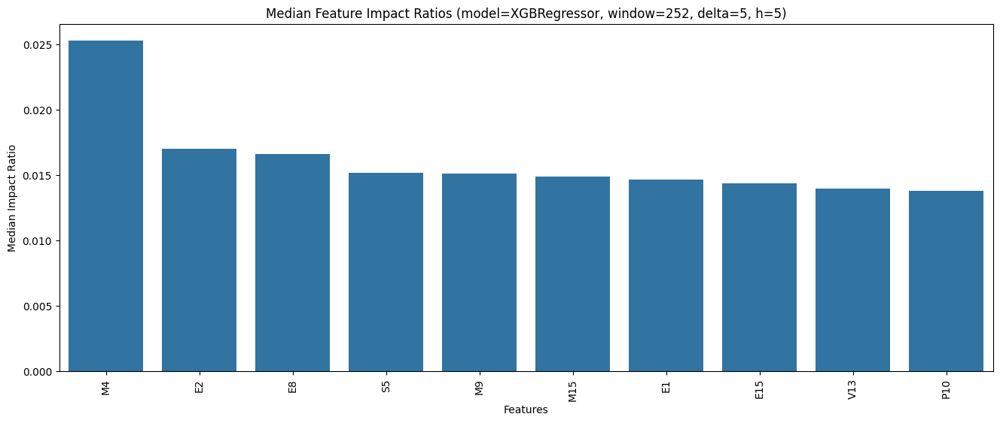

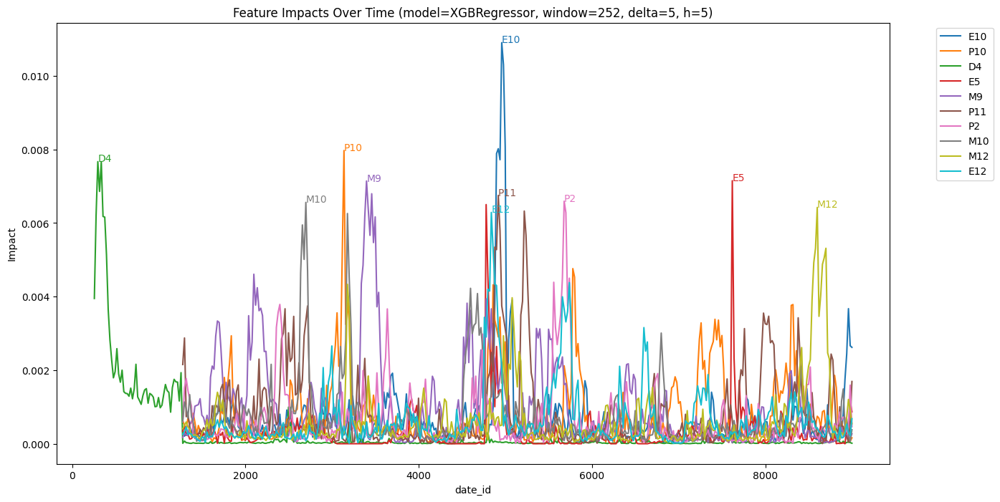

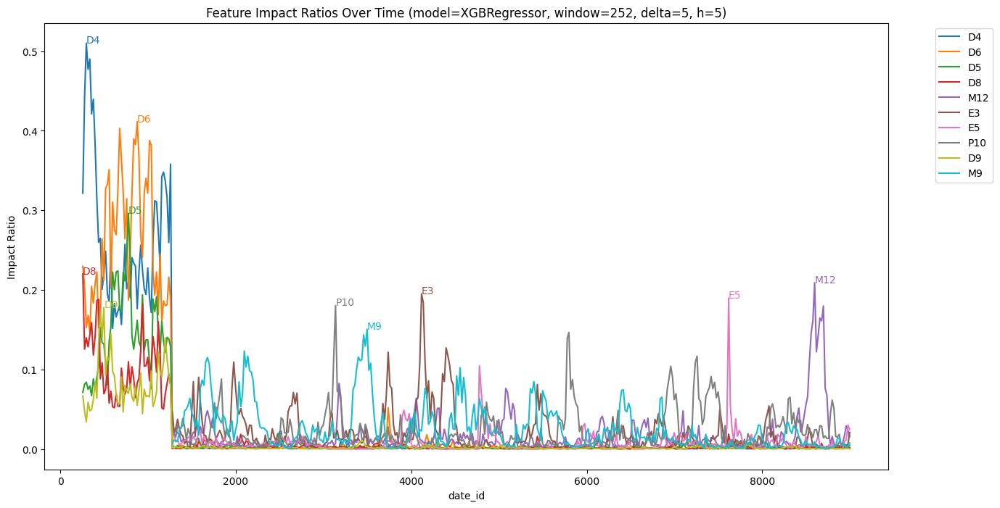

XGBRegressor RMSE: 0.039217
XGBRegressor with PowerShap RMSE: 0.041229
---


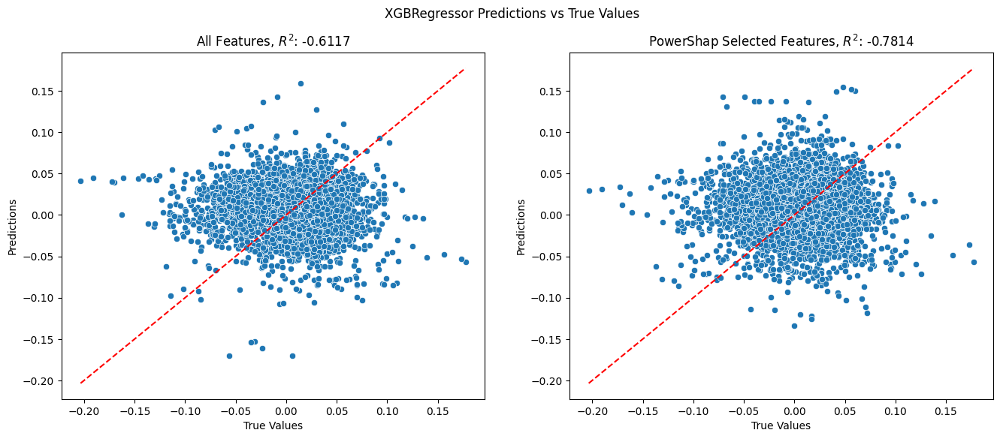

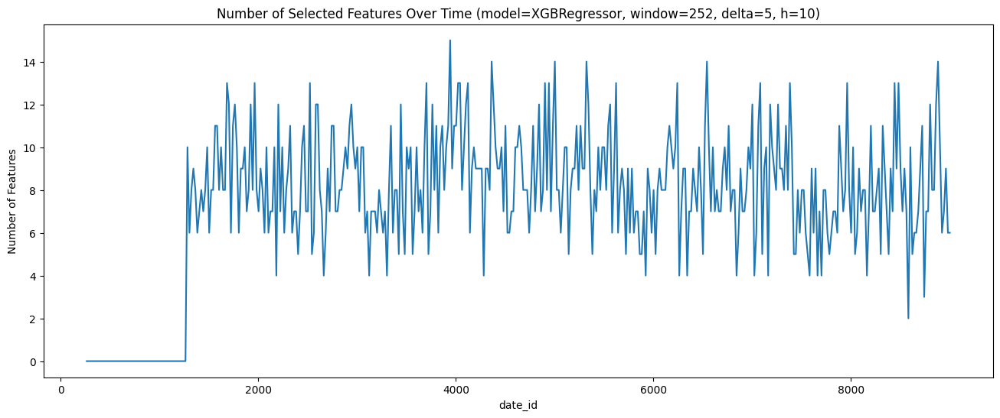

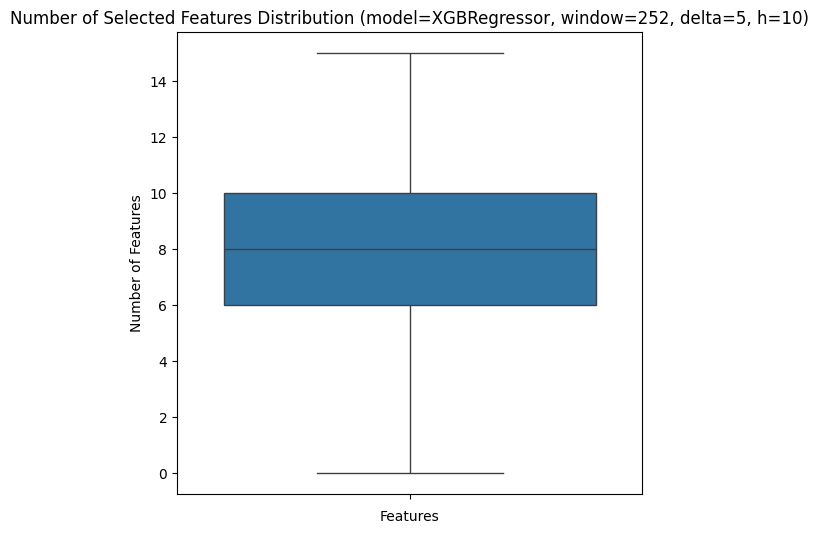

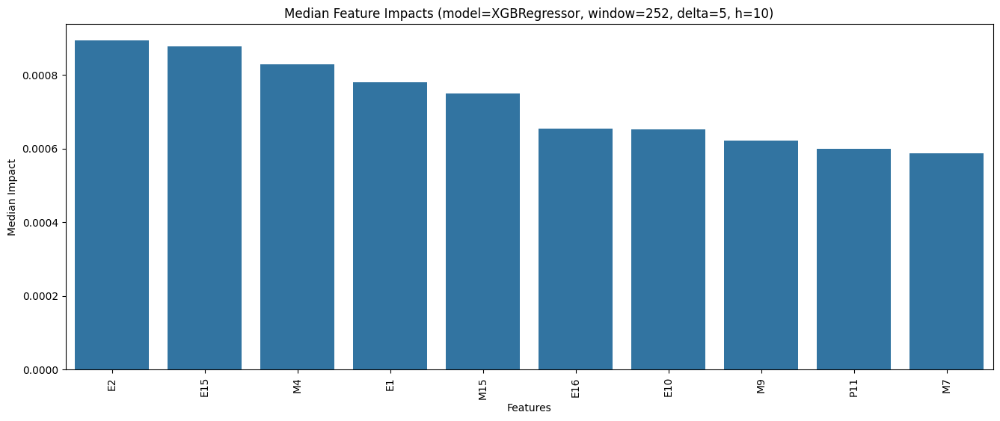

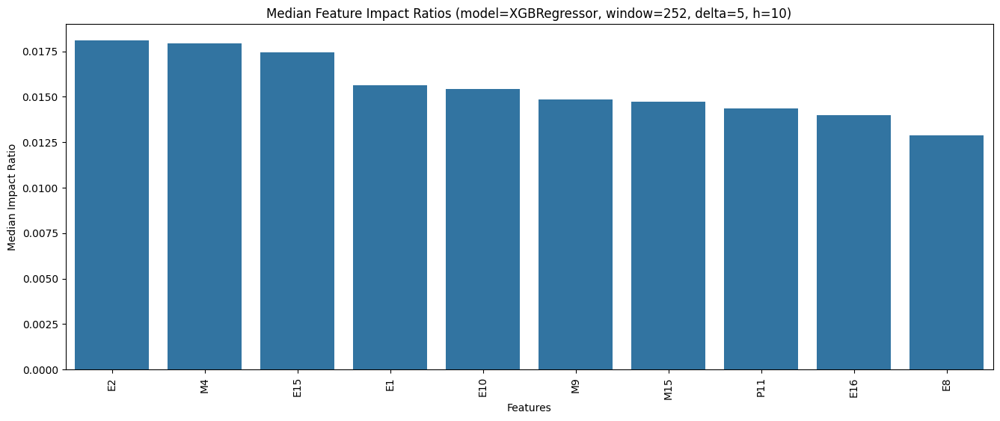

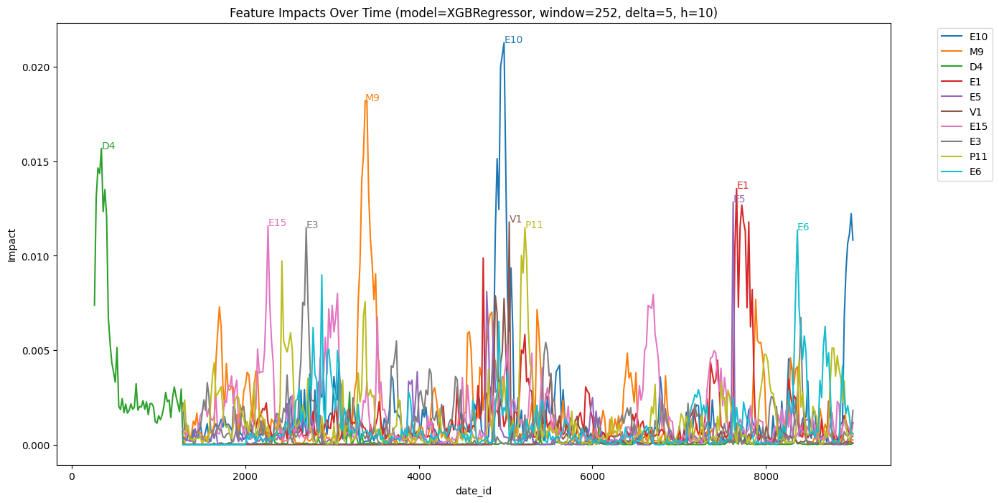

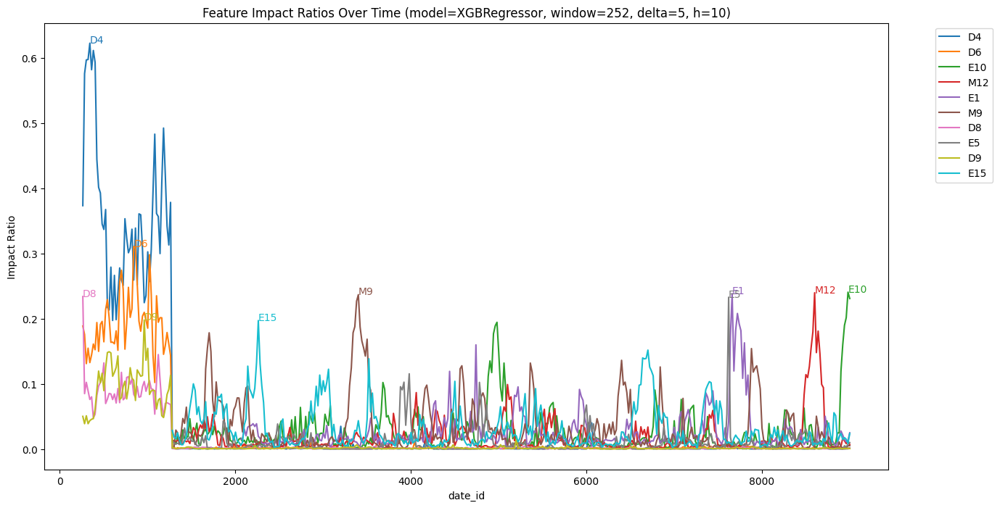

XGBRegressor RMSE: 0.054378
XGBRegressor with PowerShap RMSE: 0.057960
---


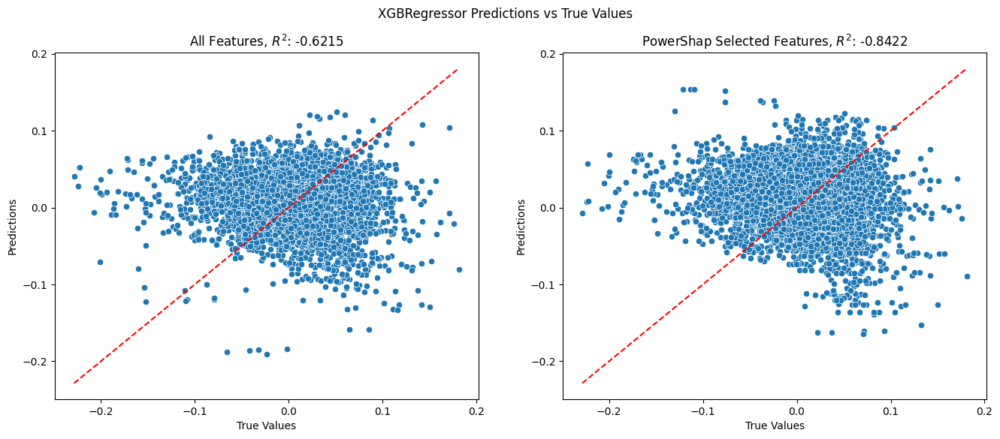

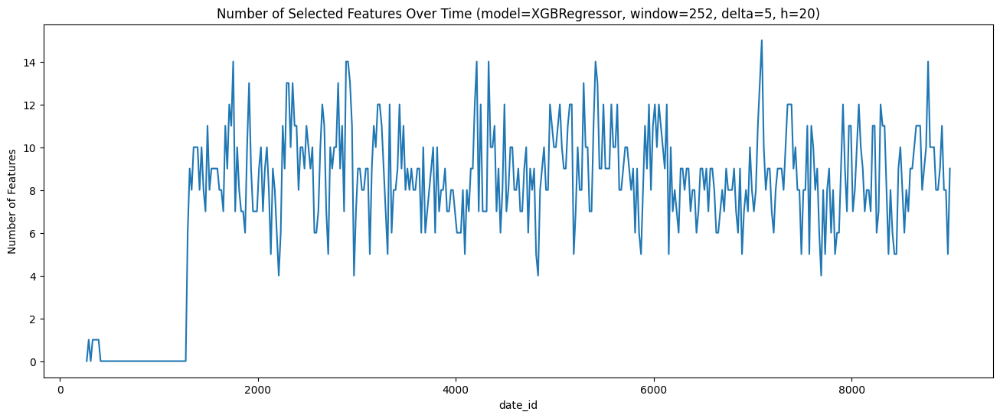

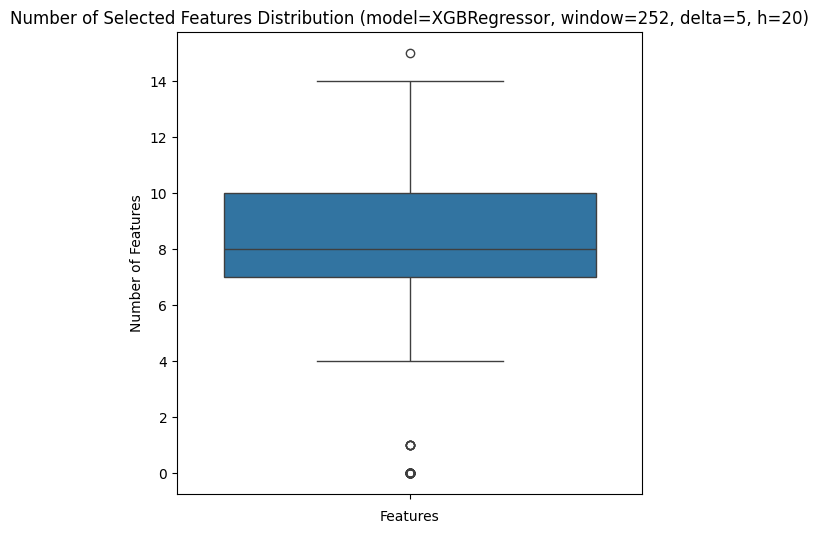

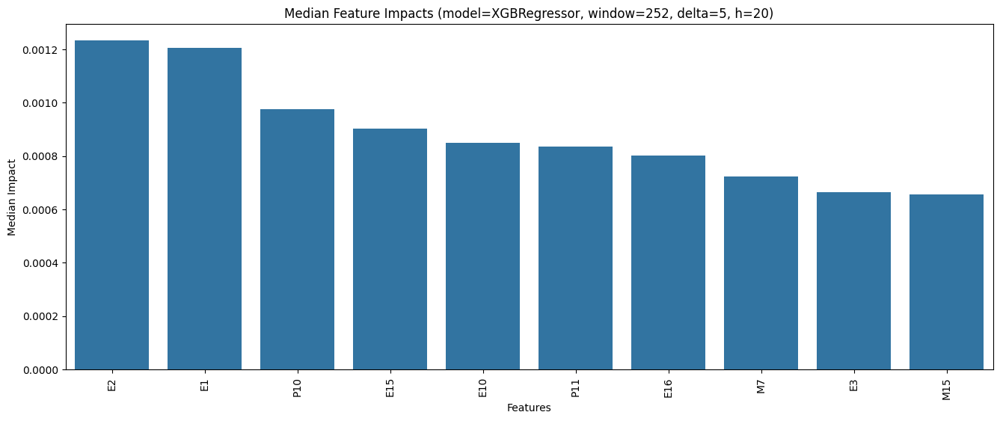

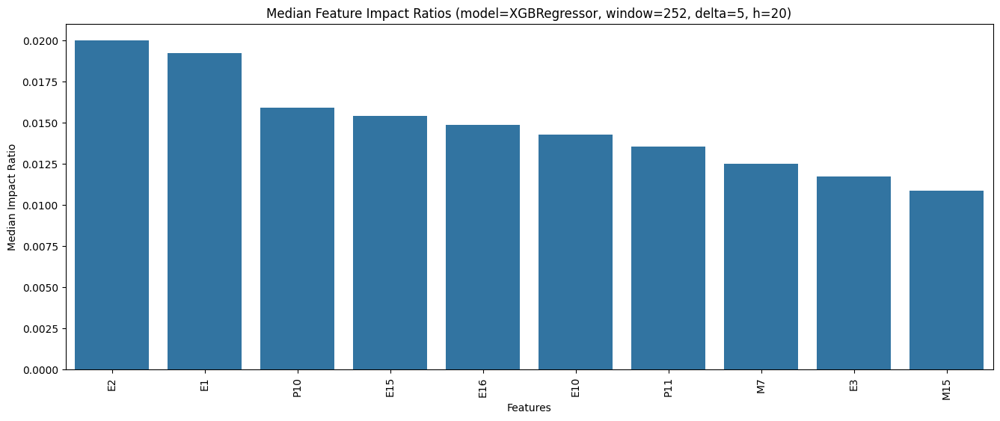

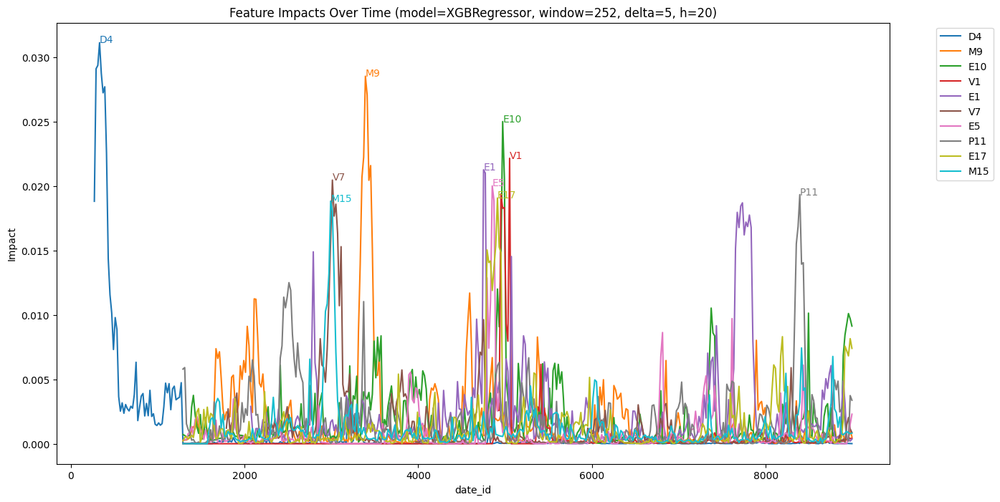

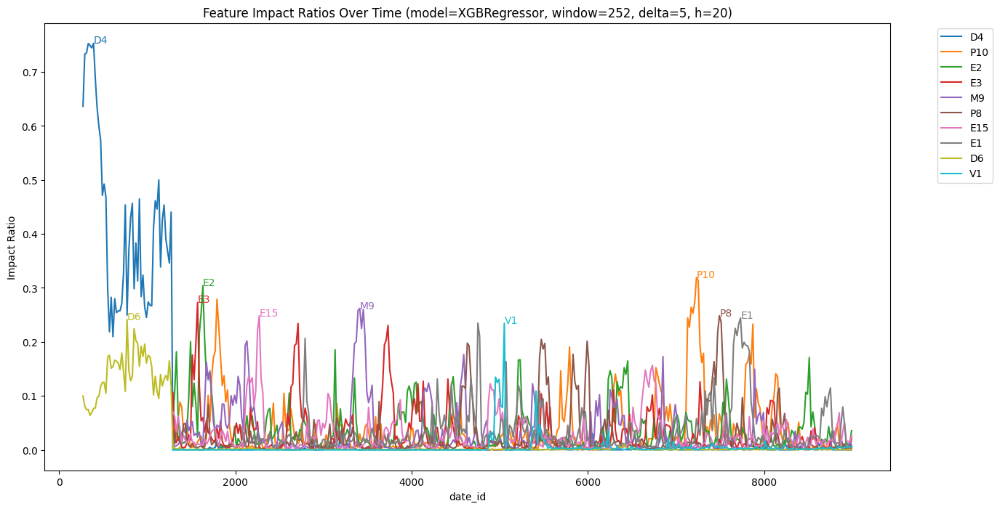

In [10]:
for h in hs:
    evaluate(window, delta, h, model)
    plot_results(window, delta, h, model)
    plot_feature_impacts(window, delta, h, model)

In [11]:
window = 252
delta = 5
model = XGBClassifier()
for h in hs:
    train(
        X = X,
        forward_returns = train_data['forward_returns'],
        window = window,
        delta = delta,
        h = h,
        model = model,
    )

Processing XGBClassifier with window=252, delta=5, h=5: 100%|██████████| 1751/1751 [14:16<00:00,  2.04it/s]
Processing XGBClassifier with window=252, delta=5, h=10: 100%|██████████| 1749/1749 [12:58<00:00,  2.25it/s]
Processing XGBClassifier with window=252, delta=5, h=20: 100%|██████████| 1745/1745 [11:43<00:00,  2.48it/s]


XGBClassifier Accuracy: 0.508818
XGBClassifier with PowerShap Accuracy: 0.520052
---


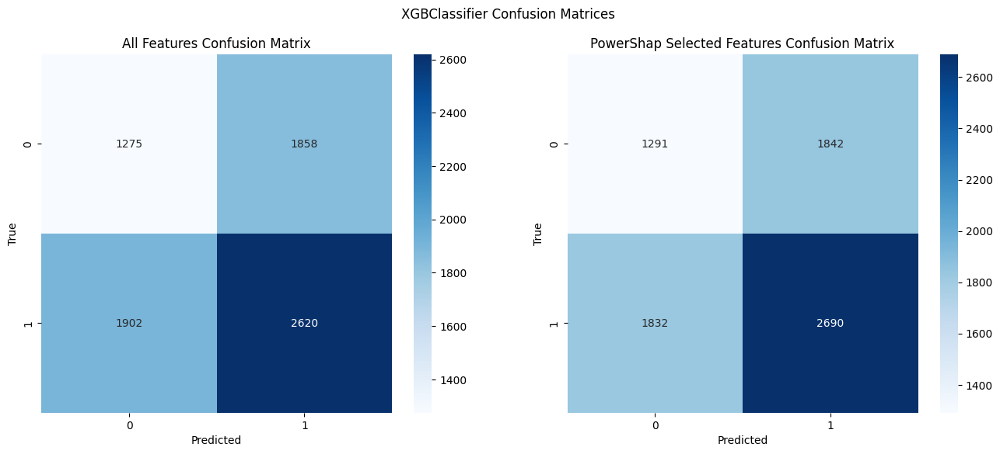

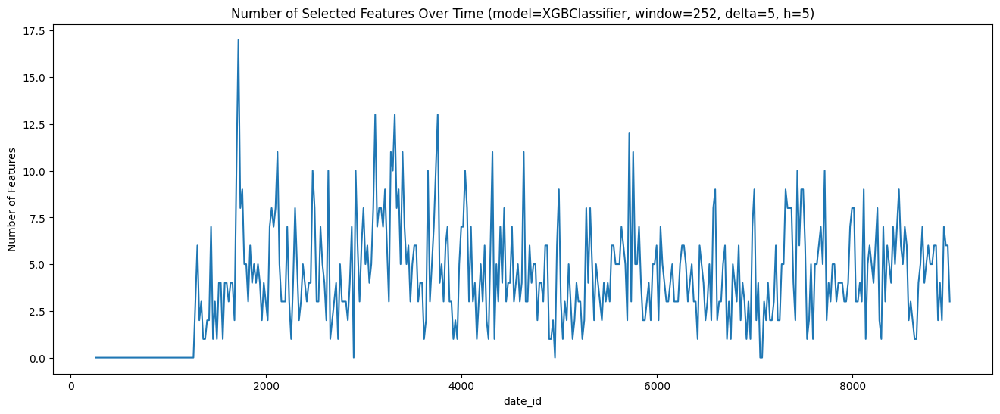

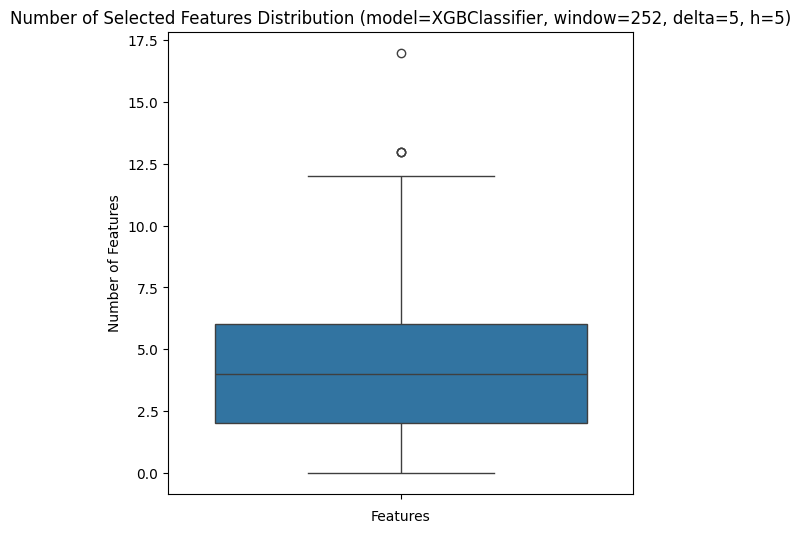

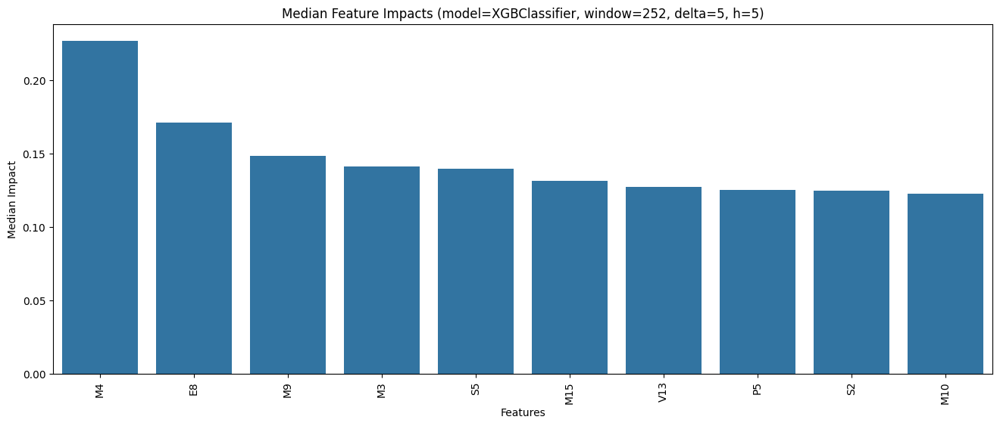

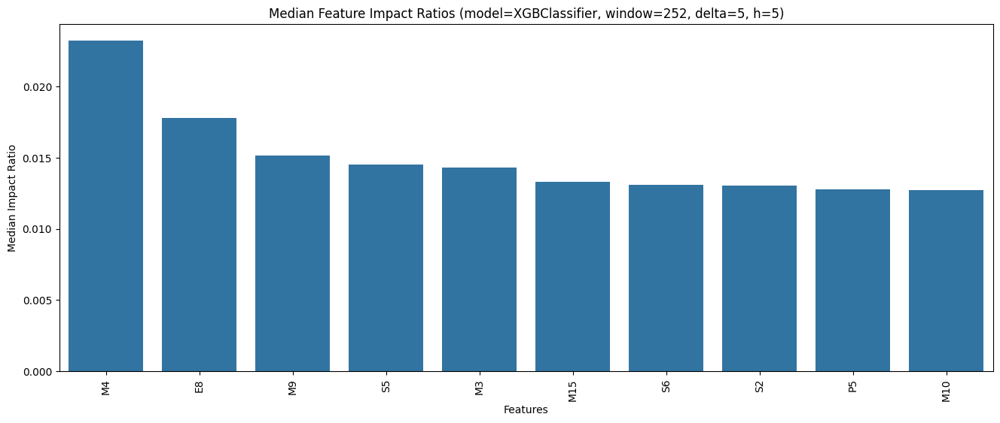

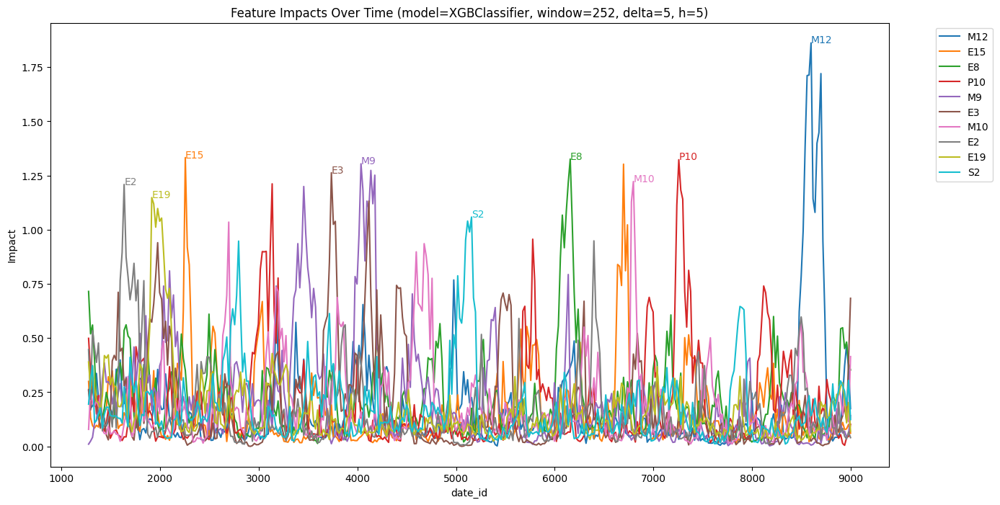

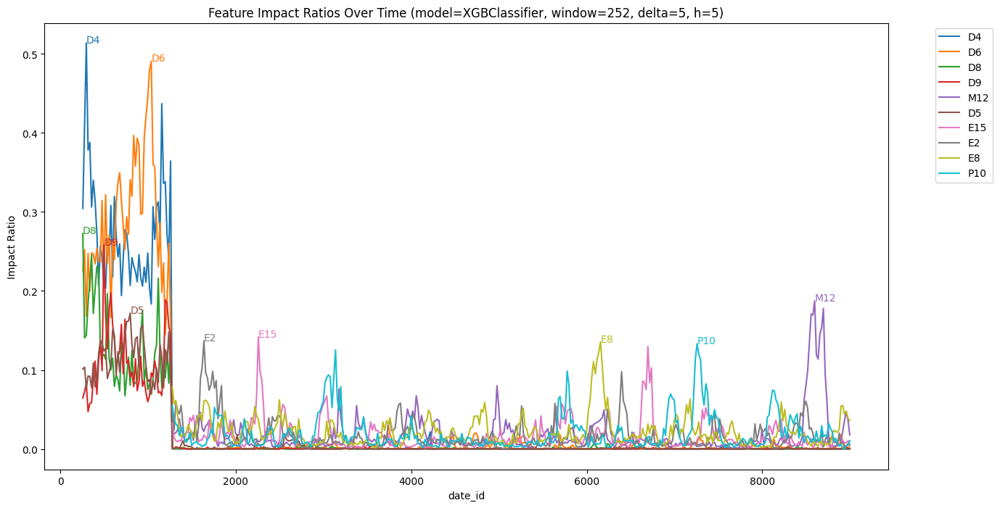

XGBClassifier Accuracy: 0.543948
XGBClassifier with PowerShap Accuracy: 0.530097
---


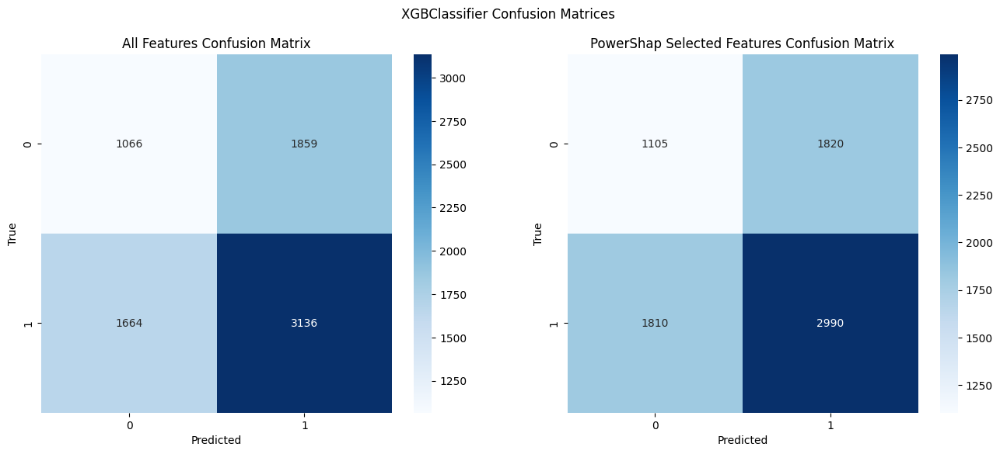

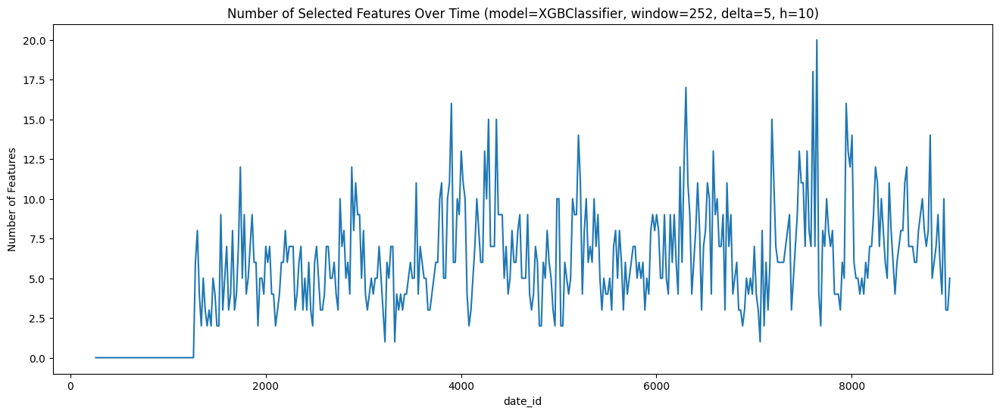

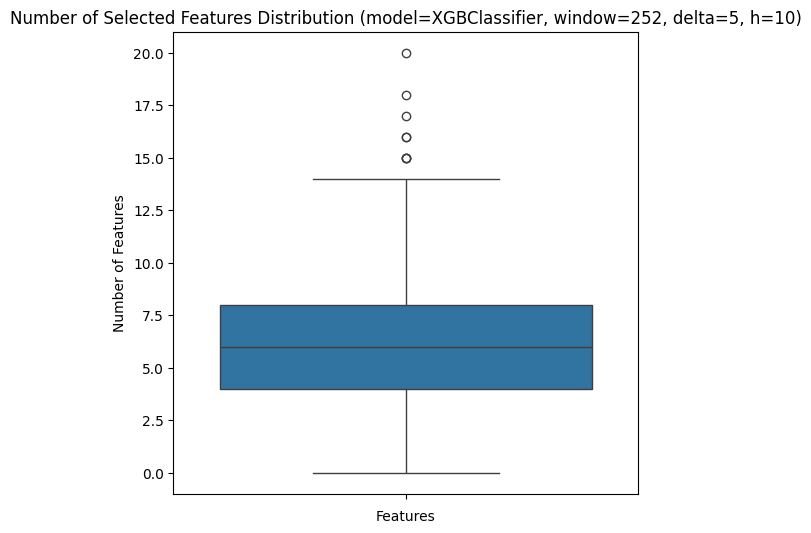

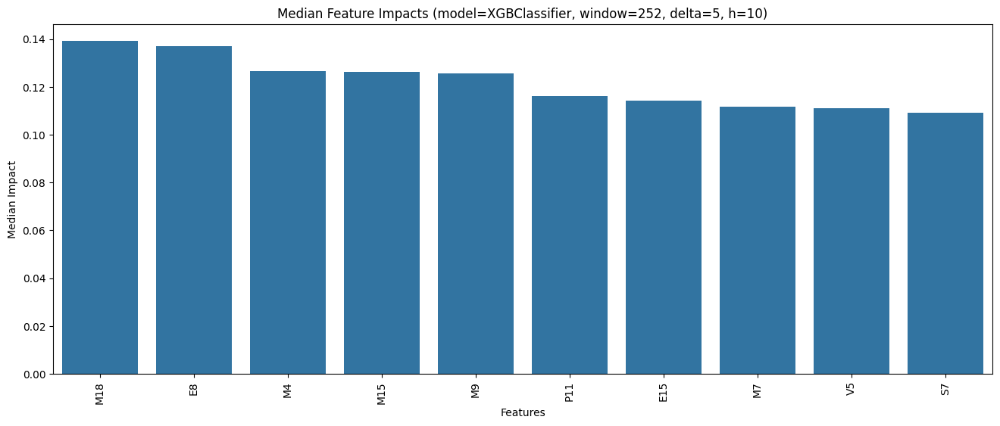

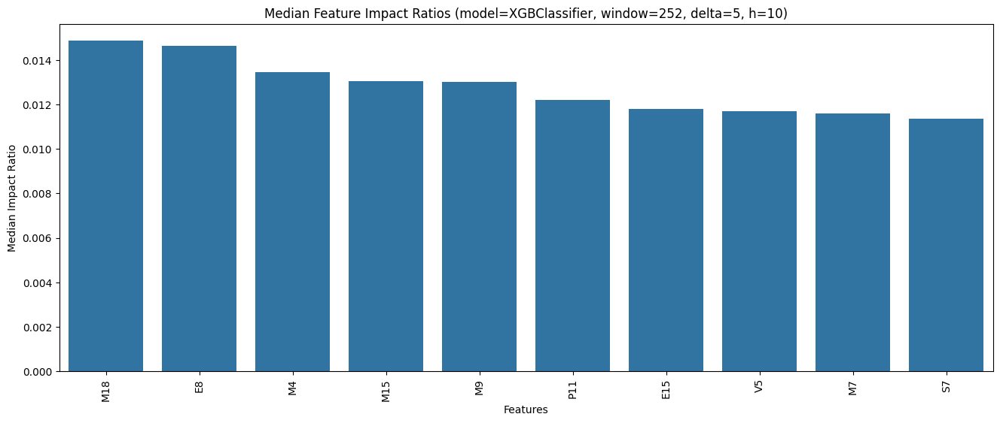

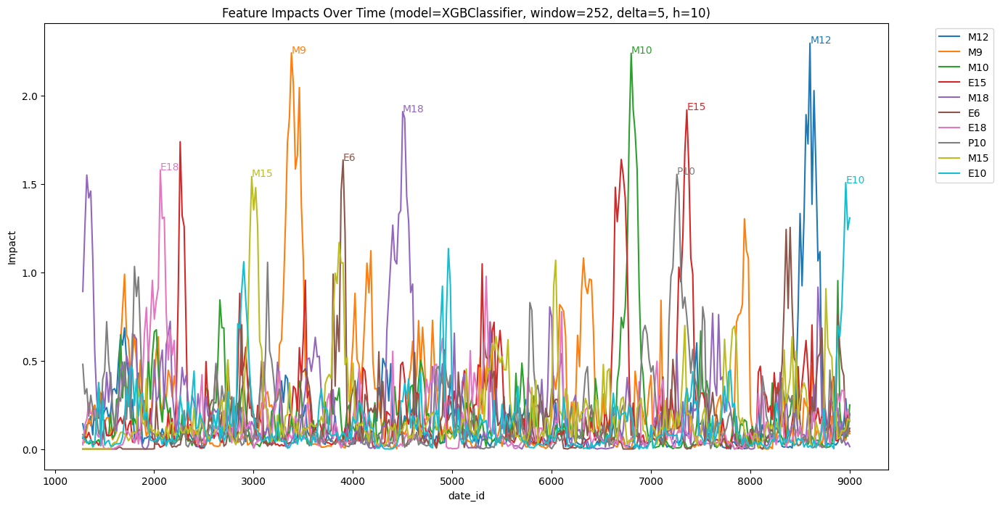

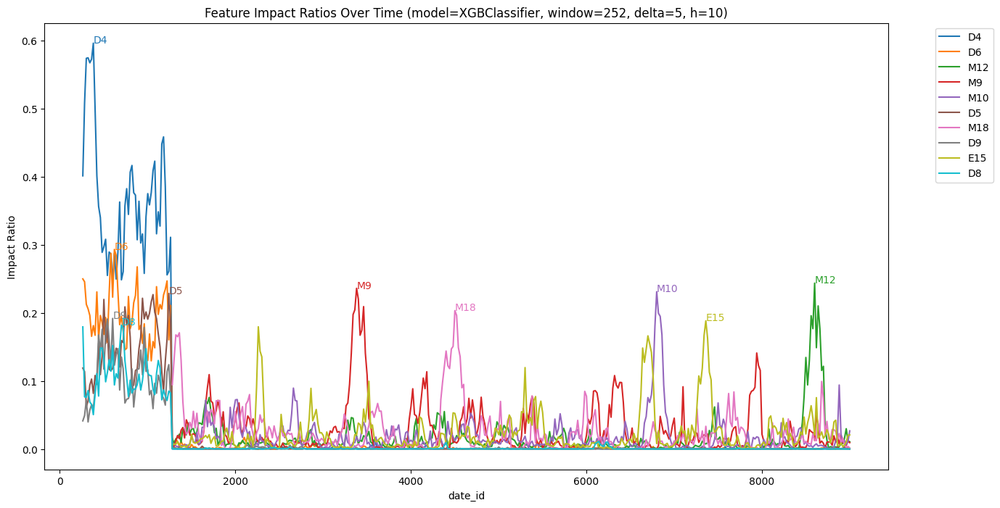

XGBClassifier Accuracy: 0.538147
XGBClassifier with PowerShap Accuracy: 0.523834
---


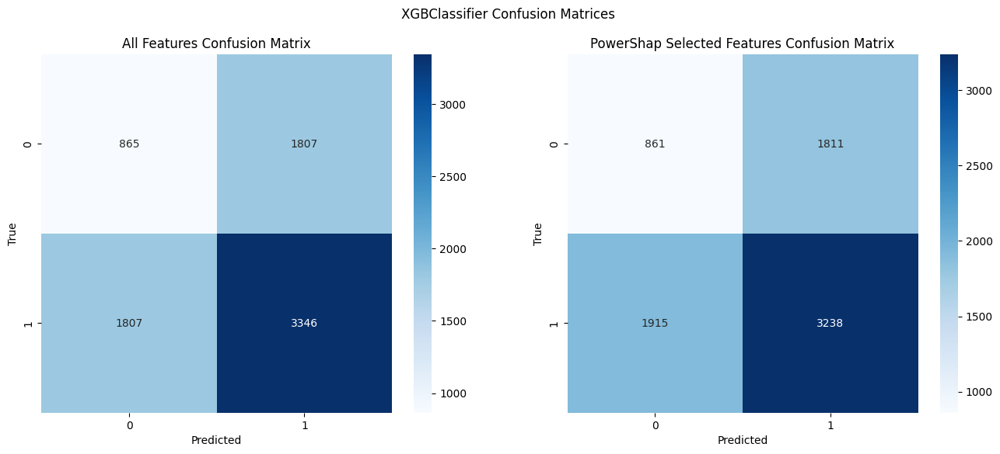

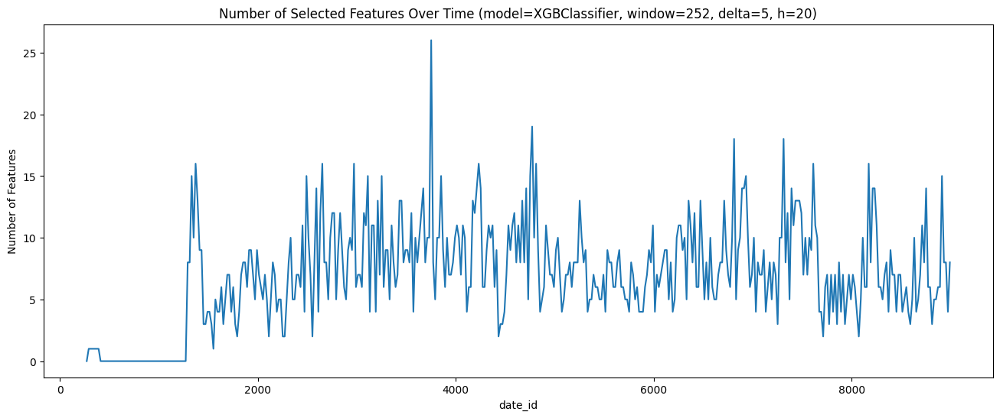

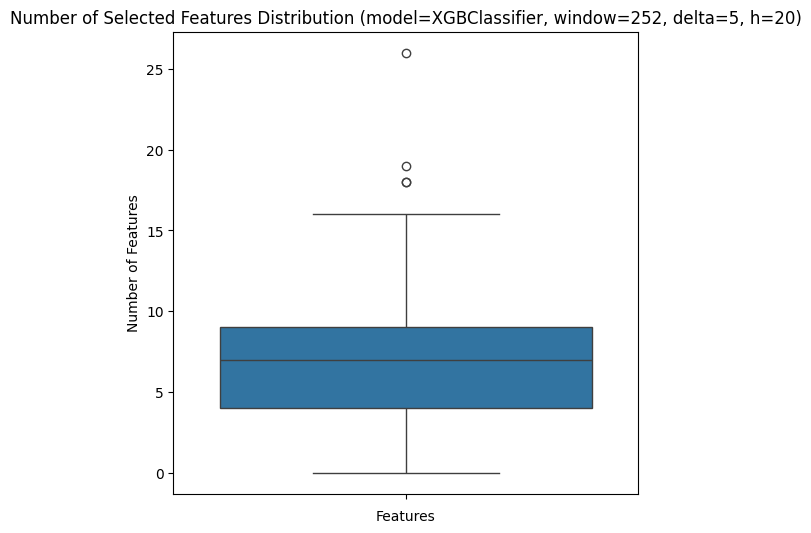

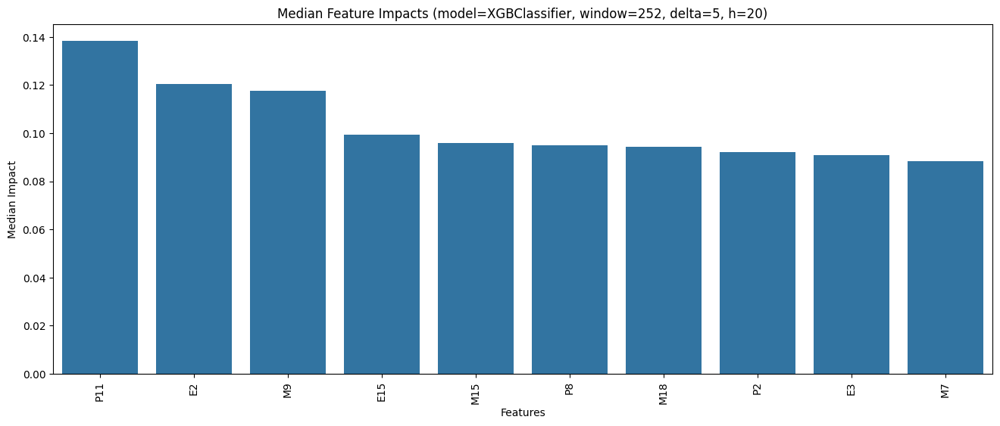

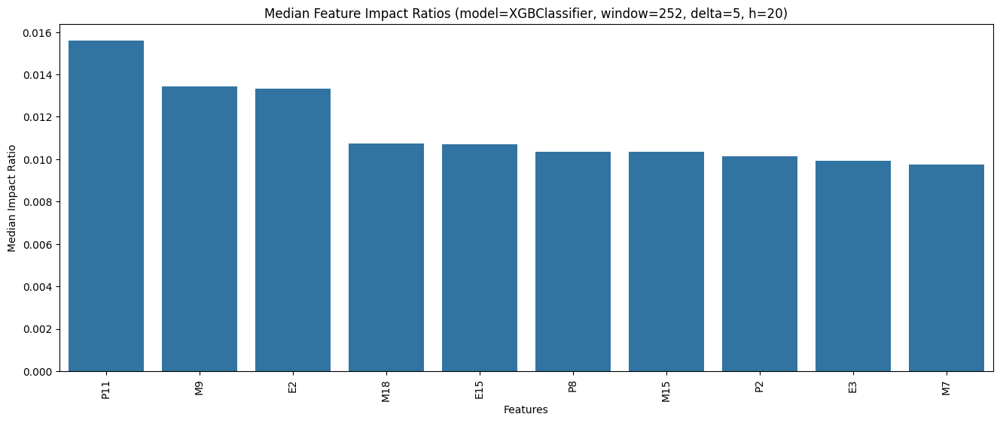

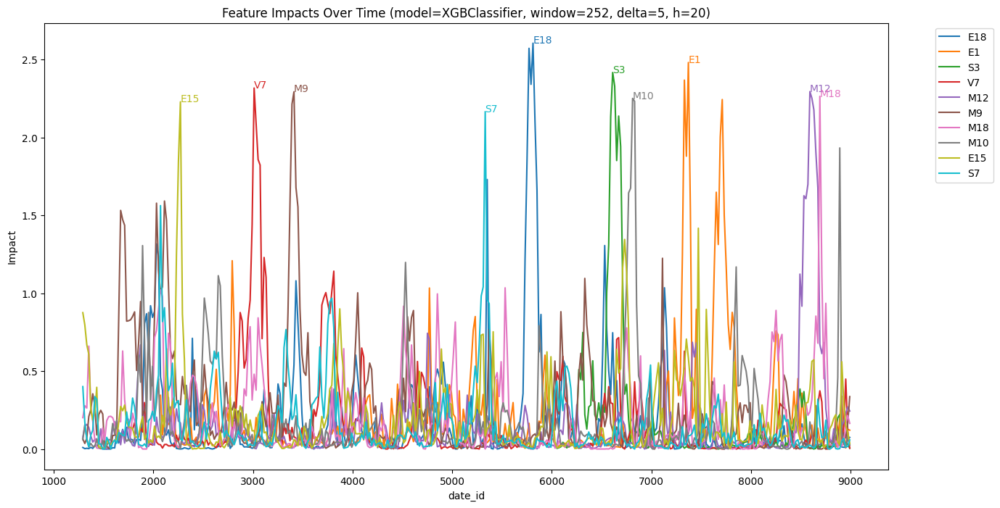

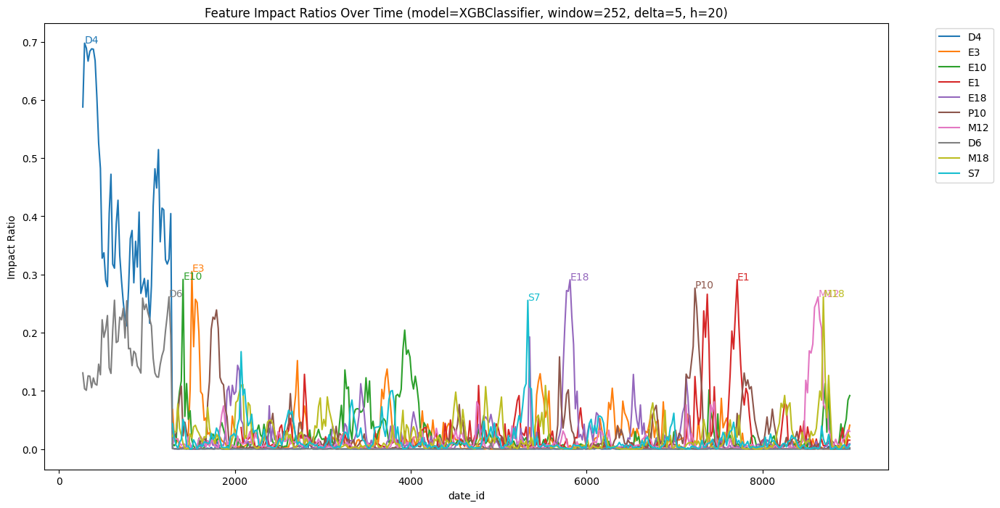

In [12]:
for h in hs:
    evaluate(window, delta, h, model)
    plot_results(window, delta, h, model)
    plot_feature_impacts(window, delta, h, model)

In [13]:
window = 252
delta = 1
model = XGBRegressor()
hs = [5, 10, 20]
for h in hs:
    train(
        X = X,
        forward_returns = train_data['forward_returns'],
        window = window,
        delta = delta,
        h = h,
        model = model,
    )

Processing XGBRegressor with window=252, delta=1, h=5:   0%|          | 0/8759 [00:00<?, ?it/s]

Processing XGBRegressor with window=252, delta=1, h=5: 100%|██████████| 8759/8759 [20:04<00:00,  7.27it/s]  
Processing XGBRegressor with window=252, delta=1, h=10: 100%|██████████| 8749/8749 [1:25:25<00:00,  1.71it/s]     
Processing XGBRegressor with window=252, delta=1, h=20: 100%|██████████| 8729/8729 [18:48<00:00,  7.74it/s]


XGBRegressor RMSE: 0.028020
XGBRegressor with PowerShap RMSE: 0.029467
---


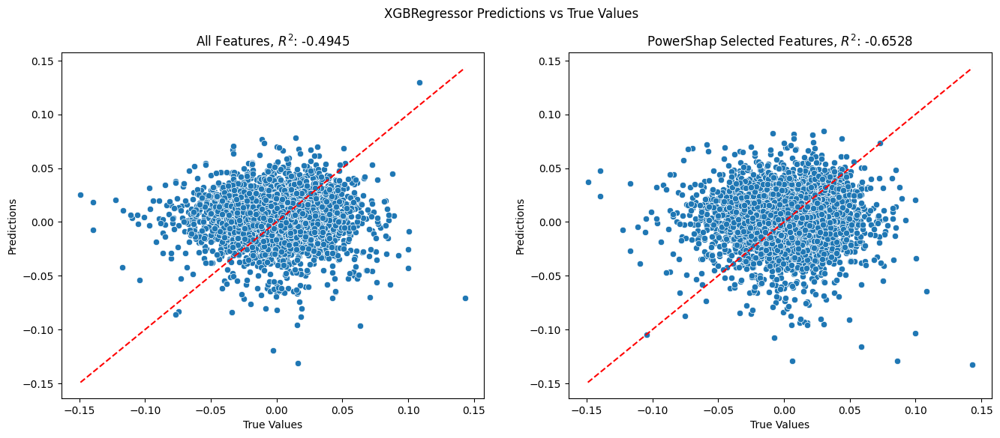

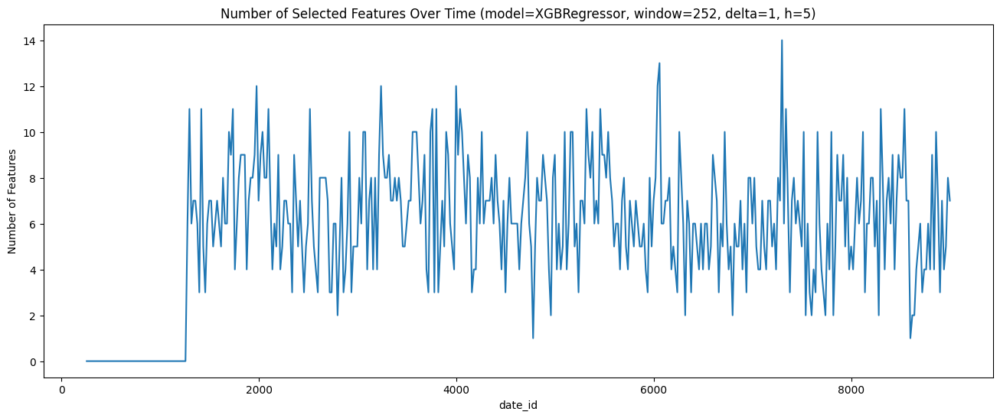

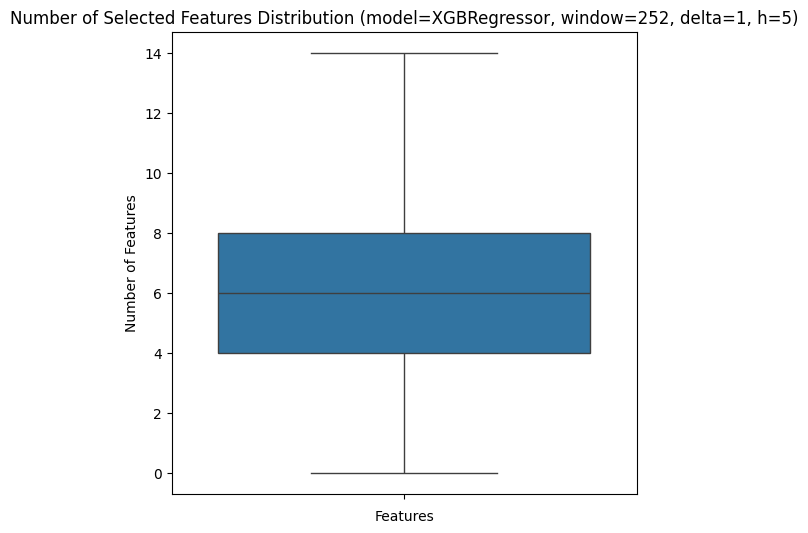

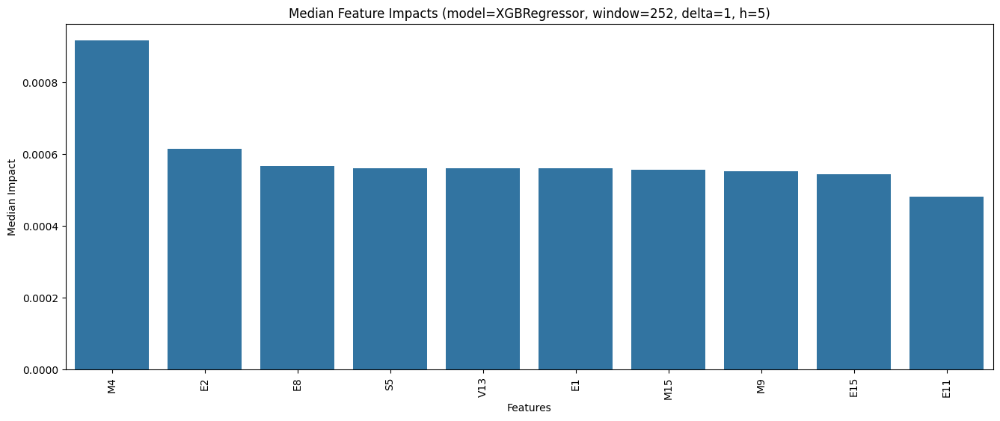

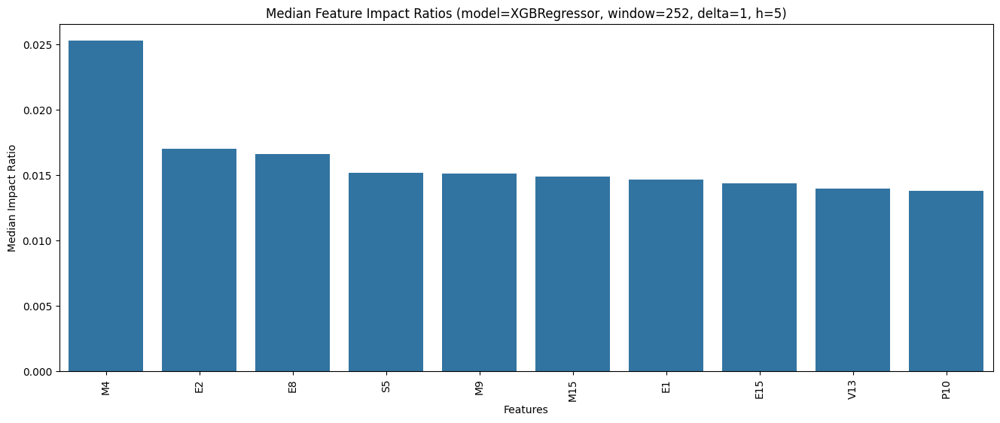

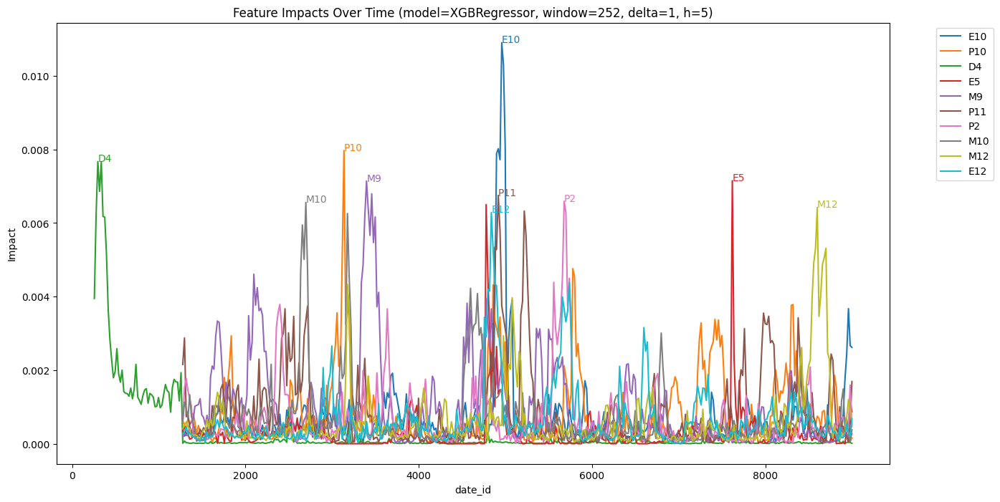

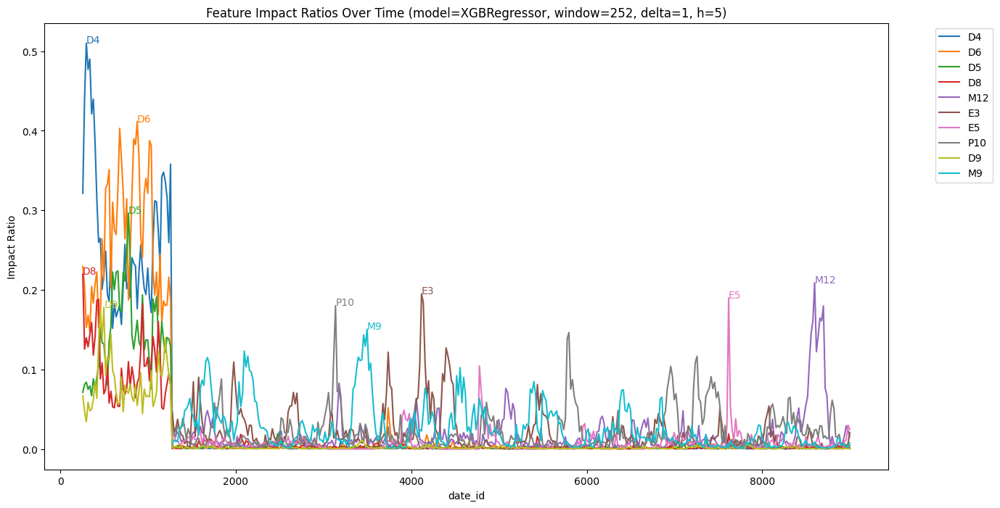

XGBRegressor RMSE: 0.038415
XGBRegressor with PowerShap RMSE: 0.040305
---


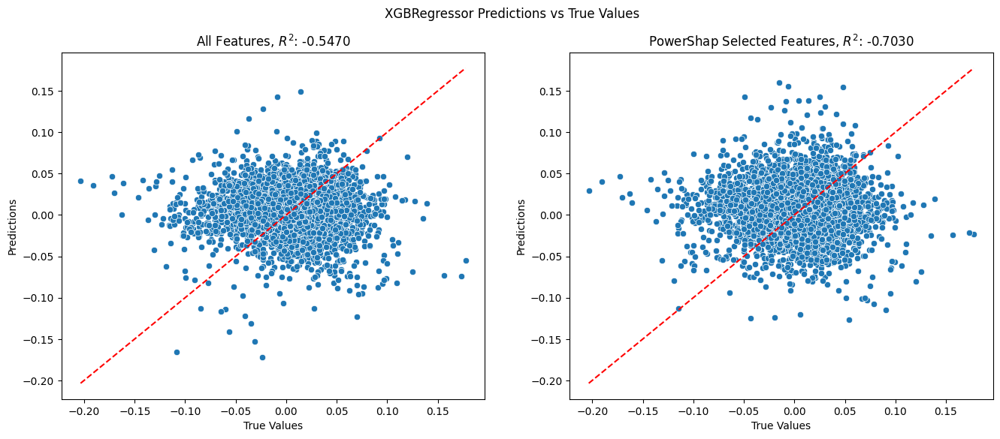

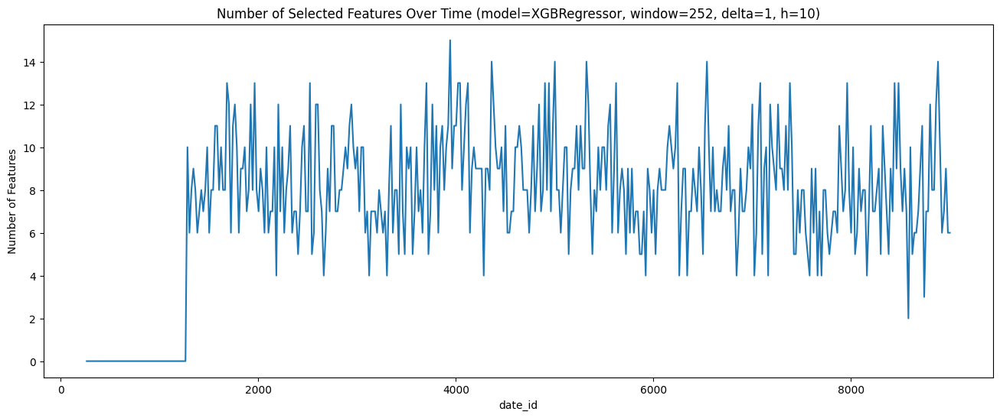

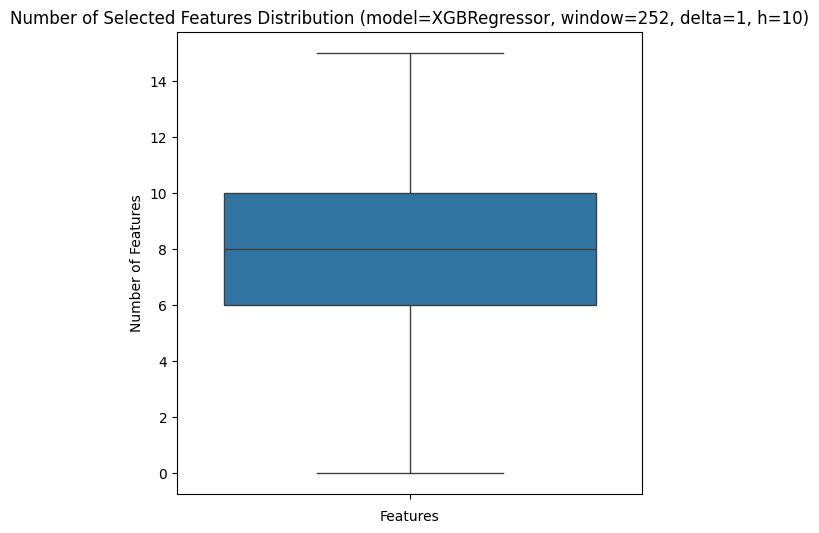

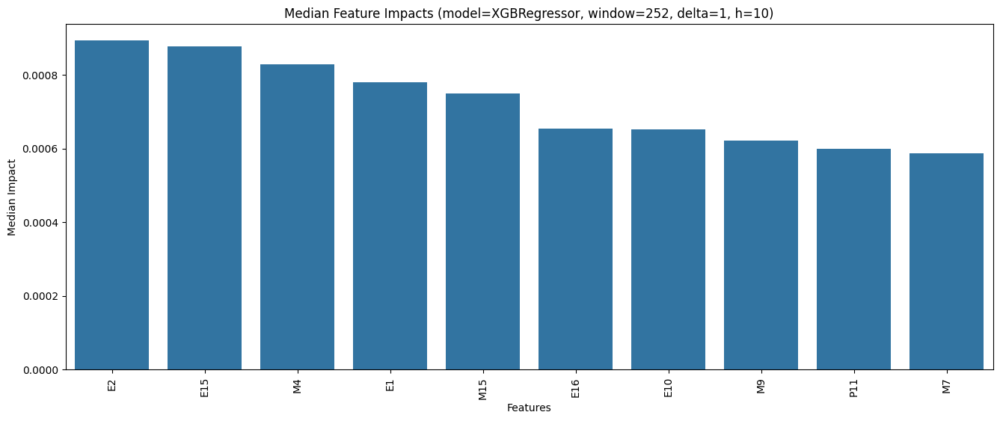

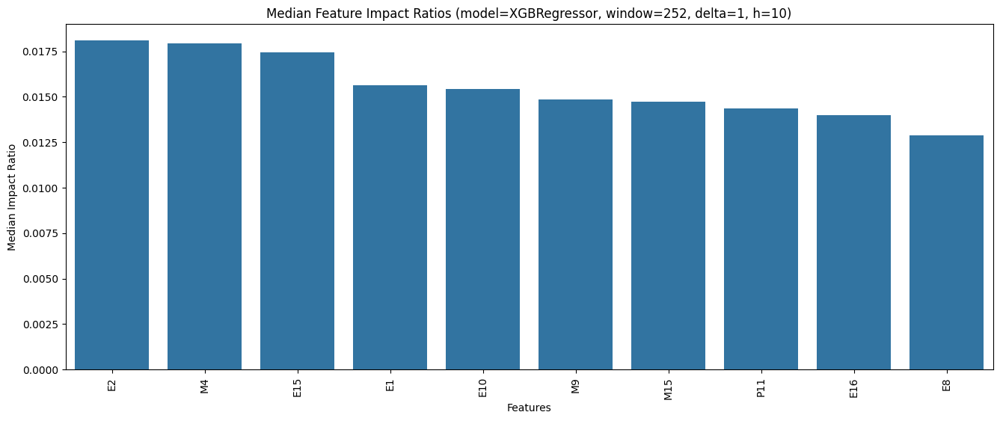

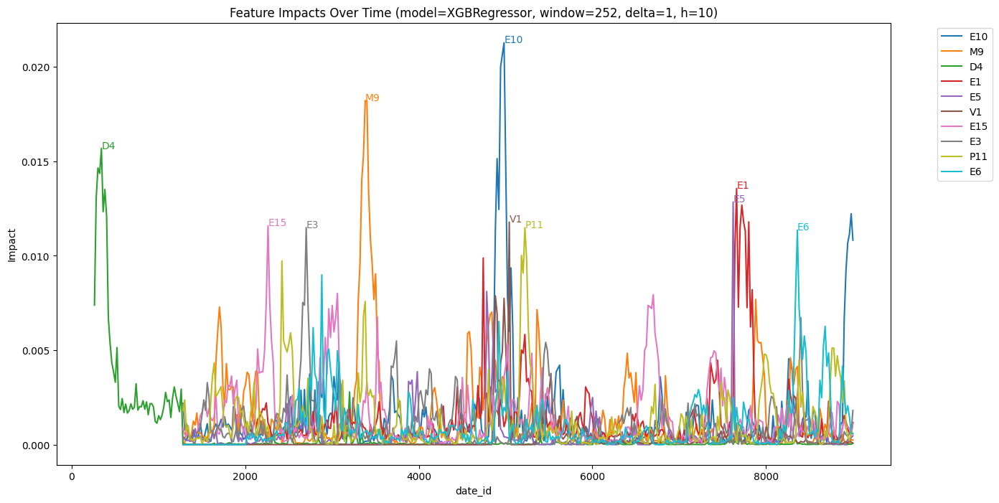

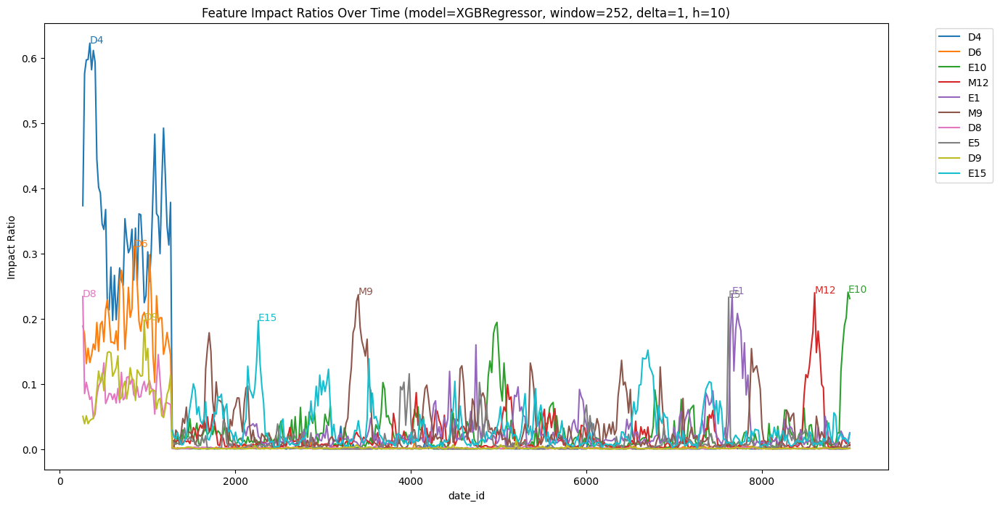

XGBRegressor RMSE: 0.053441
XGBRegressor with PowerShap RMSE: 0.057427
---


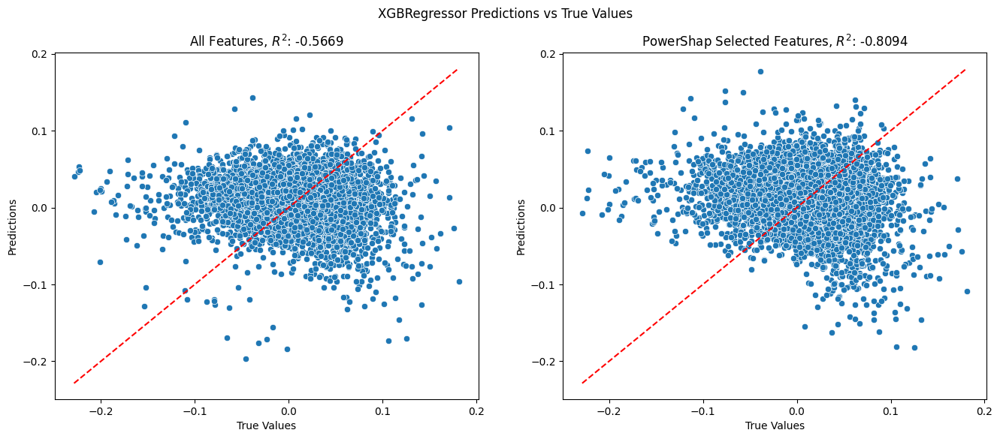

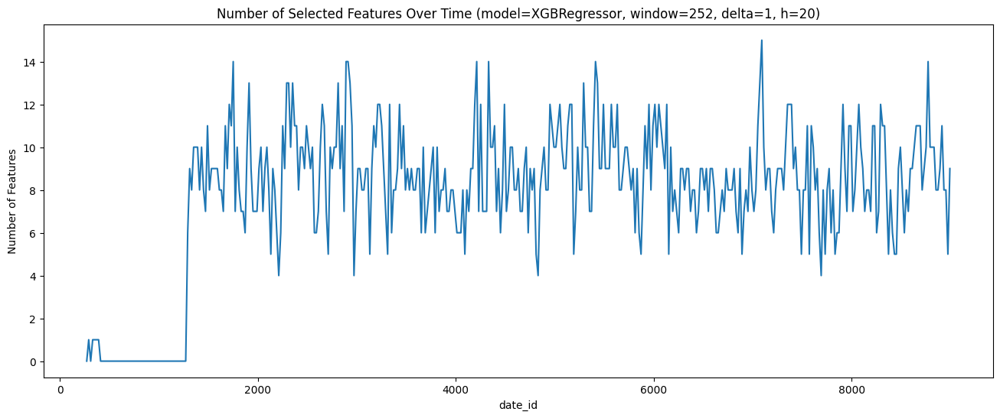

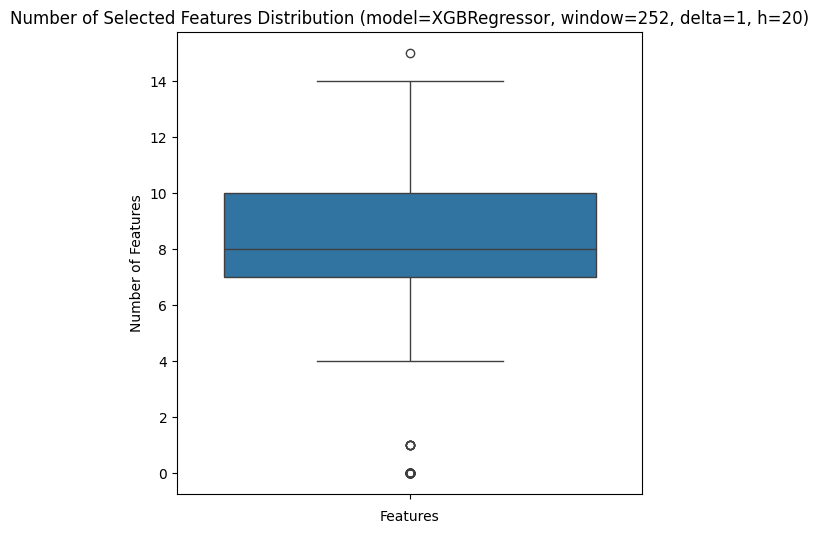

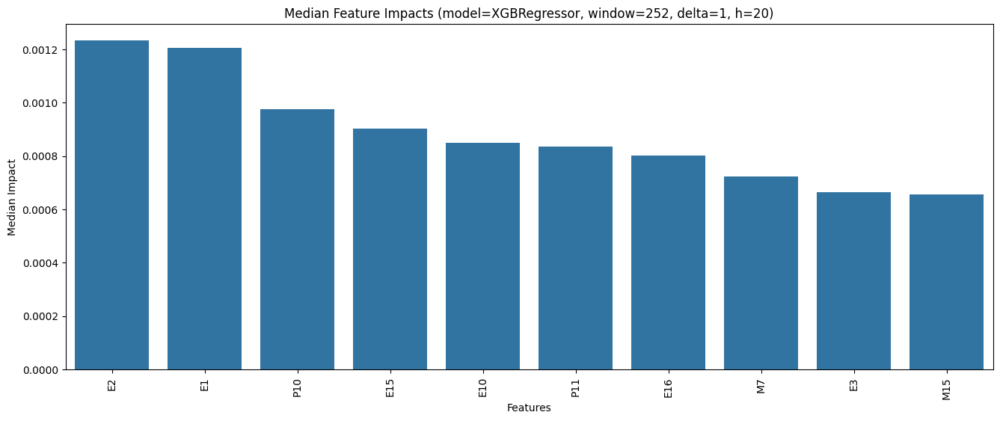

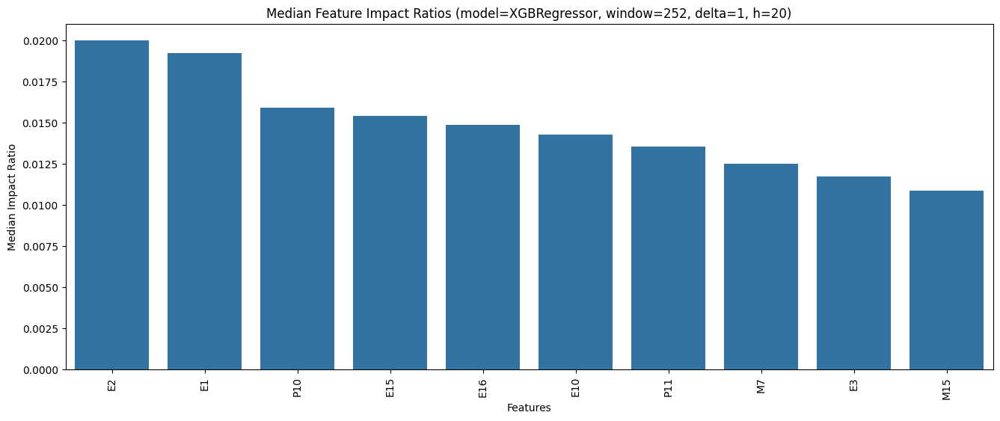

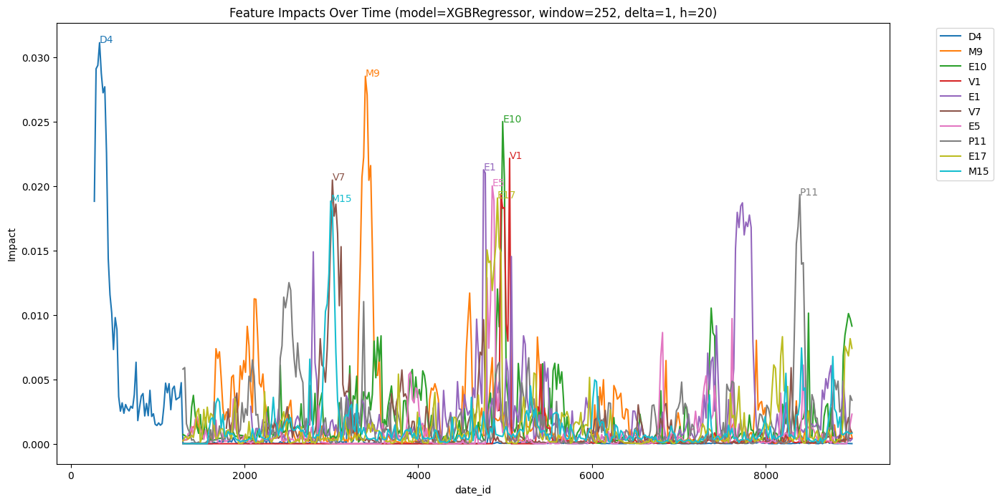

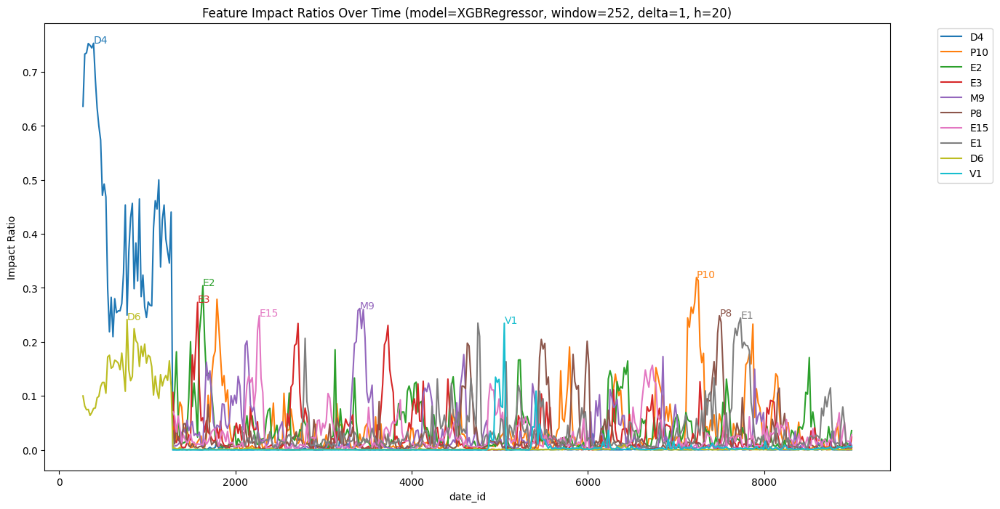

In [14]:
for h in hs:
    evaluate(window, delta, h, model)
    plot_results(window, delta, h, model)
    plot_feature_impacts(window, delta, h, model)

In [35]:
selector = PowerShap(
    model = XGBRegressor(),
    automatic=True,
    verbose=None,
    show_progress=False
)
h = 20
selector.fit(X.iloc[-1000:-200], train_data['forward_returns'].rolling(h).apply(lambda x: (1 + x).prod() - 1, raw=True).shift(-h+1).iloc[-1000:-200], verbose=None)

,model,"XGBRegressor(...bda=None, ...)"
,power_iterations,10
,power_alpha,0.01
,val_size,0.2
,power_req_iterations,0.99
,include_all,False
,automatic,True
,force_convergence,False
,limit_convergence_its,0
,limit_automatic,10
,limit_incremental_iterations,10


In [38]:
selector.get_feature_names_out()

array(['E15', 'E2', 'E6', 'E7', 'E9', 'I6', 'M1', 'M12', 'M18', 'M7',
       'P11', 'S6', 'S8', 'V13'], dtype=object)

In [39]:
selector.get_support()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False,  True, False, False, False, False,  True,  True,
       False,  True, False, False, False, False, False,  True, False,
       False, False,  True, False, False,  True, False, False, False,
       False, False,  True, False, False, False, False, False,  True,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False,  True, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False])

In [37]:
selector._processed_shaps_df

,impact,p_value,effect_size,power_0.01_alpha,0.99_power_its_req
E15,0.006680,0.0,-7.110762,1.000000,3.252747
M18,0.006395,0.0,-5.047063,1.000000,3.827880
M12,0.006143,0.0,-5.752347,1.000000,3.577860
P11,0.004774,0.0,-7.393177,1.000000,3.201576
I6,0.002919,0.0,-2.769039,0.999999,5.916087
E9,0.002661,0.0,-2.674470,0.999998,6.117092
E2,0.002510,0.0,-3.583576,1.000000,4.762697
M1,0.002444,0.0,-4.998067,1.000000,3.848395
P2,0.002336,0.1,0.000000,0.000000,0.000000
S6,0.001915,0.0,-3.895212,1.000000,4.486934


In [56]:
impacts = pd.DataFrame(columns=X.columns)
impacts.loc[0] = selector._processed_shaps_df['impact'].drop(index=['random_uniform_feature'])
impacts

,D1,D2,D3,D4,D5,D6,D7,D8,D9,E1,E10,E11,E12,E13,E14,E15,E16,E17,E18,E19,E2,E20,E3,E4,E5,E6,E7,E8,E9,I1,I2,I3,I4,I5,I6,I7,I8,I9,M1,M10,M11,M12,M13,M14,M15,M16,M17,M18,M2,M3,M4,M5,M6,M7,M8,M9,P1,P10,P11,P12,P13,P2,P3,P4,P5,P6,P7,P8,P9,S1,S10,S11,S12,S2,S3,S4,S5,S6,S7,S8,S9,V1,V10,V11,V12,V13,V2,V3,V4,V5,V6,V7,V8,V9
0,0.000006,0.0,0.000037,0.000365,0.000105,0.000046,0.000026,0.00002,0.00005,0.000586,0.001214,0.000645,0.00027,0.000708,0.000169,0.00668,0.000584,0.000296,0.000961,0.000555,0.00251,0.000566,0.000811,0.000575,0.000856,0.001568,0.001429,0.000776,0.002661,0.001238,0.000405,0.000206,0.001228,0.000284,0.002919,0.000785,0.000553,0.00012,0.002444,0.000985,0.001769,0.006143,0.000679,0.00013,0.000661,0.000261,0.000167,0.006395,0.000277,0.000358,0.000789,0.000287,0.000405,0.001902,0.000248,0.00034,0.000643,0.000655,0.004774,0.00047,0.000254,0.002336,0.00023,0.000184,0.000321,0.000573,0.000331,0.001291,0.000198,0.000479,0.000246,0.000168,0.000204,0.000753,0.00035,0.000188,0.000495,0.001915,0.00048,0.001231,0.000183,0.000146,0.000445,0.000265,0.000294,0.001882,0.00019,0.000166,0.000387,0.000292,0.000215,0.001038,0.00028,0.000236
